In [315]:
pip install ipynbcompress

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 30.8 MB/s eta 0:00:00
  Created wheel for hurry.filesize: filename=hurry.filesize-0.9-py3-none-any.whl size=4091 sha256=977d6356b141ab33057018c3195cb1423b90313fee19a7967bdd6fb08b314f23
  Stored in directory: /root/.cache/pip/wheels/31/39/13/0c3f79f41ad006d53fc6ce22b24d3626edac8afb3a2026e511
Successfully built hurry.filesize


In [316]:
from ipynbcompress import compress
filename = '/content/drive/MyDrive/Colab Notebooks/prewitt_compressed.ipynb'
out = '/content/drive/MyDrive/Colab Notebooks/prewitt_compressed1.ipynb'

In [ ]:
os.stat(filename).

## **Loading the data**

In [15]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

import tensorflow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input, GlobalAveragePooling2D, concatenate
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix

from keras.applications.inception_v3 import InceptionV3

from sklearn.metrics import classification_report

In [43]:
base_path = '/content/drive/MyDrive/Untitled folder/prewitt/'
categories = {  0: "0", 1: "1", 2: "2", 3: "3", 4: "4", 5: "5", 6: "6", 7: "7", 8: "8", 9: "9", 10: "a", 11: "b", 12: "c", 13: "d", 14: "e", 15: "f", 16: "g", 17: "h", 18: "i", 19: "j", 20: "k", 21: "l", 22: "m", 23: "n", 24: "o", 25: "p", 26: "q", 27: "r", 28: "s", 29: "t",30: "u",31: "v",32: "w",33: "x",34: "y",35: "z",}

def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df

filenames_list = []
categories_list = []

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [44]:
# train_path = '/kaggle/working/train'
# val_path = '/kaggle/working/val'
# test_path = '/kaggle/working/test'

In [45]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
BATCH_SIZE = 32
IMAGE_CHANNELS = 3
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_SHAPE = (IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)

In [46]:
df["category"] = df["category"].replace(categories)

train_df, validate_df = train_test_split(df, test_size=0.25, random_state=42)
validate_df, test_df = train_test_split(validate_df, test_size=0.5, random_state=42)

train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
total_test = test_df.shape[0]
print(
    "train size =",
    total_train,
    "validate size =",
    total_validate,
    "test size =",
    test_df.shape[0],
)

train size = 1902 validate size = 317 test size = 317


In [47]:
train_df, validate_df = train_test_split(df, test_size=0.25, random_state=42)
validate_df, test_df = train_test_split(validate_df, test_size=0.5, random_state=42)

In [48]:
datagen = image.ImageDataGenerator(rescale = 1.0 / 255)

In [49]:
train_generator = datagen.flow_from_dataframe(
    train_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

validation_generator = datagen.flow_from_dataframe(
    validate_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

test_generator = datagen.flow_from_dataframe(
    test_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    color_mode="rgb",
    class_mode="categorical",
    batch_size=1,
    shuffle=False,
)

Found 1902 validated image filenames belonging to 36 classes.
Found 317 validated image filenames belonging to 36 classes.
Found 317 validated image filenames belonging to 36 classes.


In [50]:
EPOCHS = 50
learning_rate_reduction = ReduceLROnPlateau(
    monitor="val_accuracy", patience=3, verbose=1, factor=0.3, min_lr=0.0000001
)
early_stop = EarlyStopping(
    patience=10,
    verbose=1,
    monitor="val_accuracy",
    mode="max",
    min_delta=0.001,
    restore_best_weights=True,
)

In [51]:
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = validation_generator.n // validation_generator.batch_size

## **SqueezeNet**

In [52]:
bnmomemtum = 0.9

def fire_module(x, squeeze, expand):
    y = Conv2D(filters=squeeze, kernel_size=1, activation="relu", padding="same")(x)
    y = BatchNormalization(momentum=bnmomemtum)(y)
    y1 = Conv2D(filters=expand // 2, kernel_size=1, activation="relu", padding="same")(y)
    y1 = BatchNormalization(momentum=bnmomemtum)(y1)
    y3 = Conv2D(filters=expand // 2, kernel_size=3, activation="relu", padding="same")(y)
    y3 = BatchNormalization(momentum=bnmomemtum)(y3)
    return concatenate([y1, y3])

def SqueezeNet(input_shape, num_classes):
    input = Input(shape=input_shape)
    y = Conv2D(kernel_size=7, filters=96, strides=2, padding="same", activation="relu")(input)
    y = BatchNormalization(momentum=bnmomemtum)(y)
    y = MaxPooling2D(pool_size=3, strides=2)(y)
    y = fire_module(y, 16, 64)
    y = fire_module(y, 16, 64)
    y = fire_module(y, 32, 128)
    y = MaxPooling2D(pool_size=3, strides=2)(y)
    y = fire_module(y, 32, 128)
    y = fire_module(y, 48, 192)
    y = fire_module(y, 48, 192)
    y = fire_module(y, 64, 256)
    y = MaxPooling2D(pool_size=2)(y)
    y = fire_module(y, 64, 256)
    y = Conv2D(kernel_size=1, filters=1000, strides=1, padding="same", activation="relu")(y)
    y = GlobalAveragePooling2D()(y)
    y = Dense(num_classes, activation="softmax")(y)
    model = Model(input, y)
    return model

In [53]:
squeezenet_model = SqueezeNet(
    input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS), num_classes=len(categories)
)
squeezenet_model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
squeezenet_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 112, 112,  │     14,208 │ input_layer[0][0] │
│                     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 112, 112,  │        384 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 55, 55,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 55, 55,    │      1,552 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │         64 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 55, 55,    │        544 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 55, 55,    │      4,640 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 55, 55,    │          0 │ batch_normalizat… │
│ (Concatenate)       │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 55, 55,    │      1,040 │ concatenate[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │         64 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 55, 55,    │        544 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 55, 55,    │      4,640 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │        128 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │        128 │ conv2d_6[0][0]  

 Total params: 675,564 (2.58 MB)

 Trainable params: 672,172 (2.56 MB)

 Non-trainable params: 3,392 (13.25 KB)

In [54]:
squeezenet_history = squeezenet_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 854s 14s/step - accuracy: 0.1312 - loss: 3.1587 - val_accuracy: 0.0590 - val_loss: 6.2164 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 5s 96ms/step - accuracy: 0.3750 - loss: 2.0274

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.3750 - loss: 2.0274 - val_accuracy: 0.0729 - val_loss: 5.9088 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 41s 262ms/step - accuracy: 0.4757 - loss: 1.6366 - val_accuracy: 0.3819 - val_loss: 2.1857 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8125 - loss: 0.9029 - val_accuracy: 0.3854 - val_loss: 2.3208 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - accuracy: 0.6947 - loss: 0.9144 - val_accuracy: 0.5972 - val_loss: 1.4369 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.6875 - loss: 0.8917 - val_accuracy: 0.5521 - val_loss: 1.4841 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 12s 196ms/step - accuracy: 0.7908 - loss: 0.6298 - val_accuracy: 0.6354 - val_loss: 1.1885 - learning_rate: 0.0010
Epoch 8/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.7188 - loss: 0.7272 - val_accuracy:

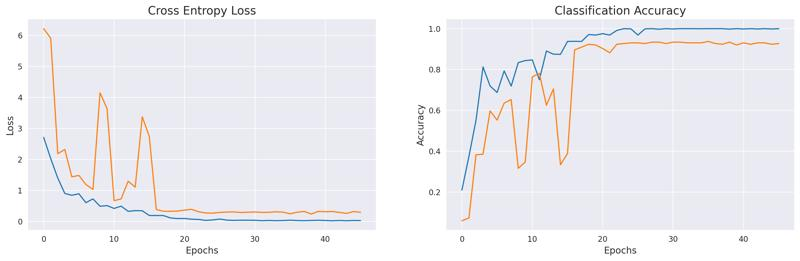

In [55]:
error = pd.DataFrame(squeezenet_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [56]:
result = squeezenet_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = squeezenet_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78        14
           1       1.00      0.92      0.96        12
           2       0.88      0.88      0.88         8
           3       1.00      1.00      1.00         7
           4       0.69      1.00      0.82         9
           5       1.00      0.73      0.85        15
           6       0.57      0.67      0.62         6
           7       1.00      0.82      0.90        11
           8       0.92      1.00      0.96        11
           9       1.00      1.00      1.00        13
           a       1.00      1.00      1.00         7
           b       0.88      0.88      0.88         8
           c       1.00      1.00      1.00         8
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00         7
           f       1.00      0.92      0.96        12
           g       1.00      1.00      1.00         4
     

## **InceptionV3**

In [57]:
pre_trained = InceptionV3(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE, pooling='avg')

for layer in pre_trained.layers:
    layer.trainable = False

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [58]:
x = pre_trained.output
x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(36, activation='softmax')(x)

inception_model = Model(inputs = pre_trained.input, outputs = predictions)
inception_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
inception_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 111, 111,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_26[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_27[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_28[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_29 (Conv2D)  │ (None, 54, 54,    │      5,120 │ max_pooling2d_3[… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_29[0][0]   │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_30[0][0]   │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 23,946,052 (91.35 MB)

 Trainable params: 2,139,172 (8.16 MB)

 Non-trainable params: 21,806,880 (83.19 MB)

In [59]:
inception_history = inception_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 42s 430ms/step - accuracy: 0.4933 - loss: 2.1537 - val_accuracy: 0.5590 - val_loss: 1.3766 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.6562 - loss: 1.2417

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - accuracy: 0.6562 - loss: 1.2417 - val_accuracy: 0.5590 - val_loss: 1.3906 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - accuracy: 0.9044 - loss: 0.3157 - val_accuracy: 0.7812 - val_loss: 0.7470 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.9688 - loss: 0.2195 - val_accuracy: 0.7569 - val_loss: 0.8073 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 12s 199ms/step - accuracy: 0.9292 - loss: 0.2324 - val_accuracy: 0.8438 - val_loss: 0.6507 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 0.9062 - loss: 0.5319 - val_accuracy: 0.8542 - val_loss: 0.6587 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 20s 346ms/step - accuracy: 0.9707 - loss: 0.0866 - val_accuracy: 0.8368 - val_loss: 0.5657 - learning_rate: 0.0010
Epoch 8/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.9688 - loss: 0.0514 - val_accuracy

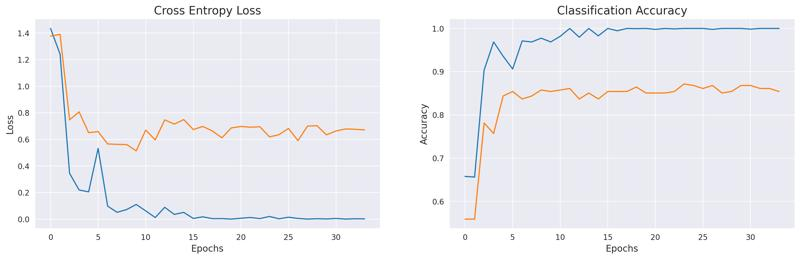

In [60]:
error = pd.DataFrame(inception_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [61]:
result = inception_model.predict(test_generator,verbose = 0)

y_pred = np.argmax(result, axis = 1)

y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = inception_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78        14
           1       1.00      1.00      1.00        12
           2       0.75      0.75      0.75         8
           3       1.00      1.00      1.00         7
           4       0.50      0.67      0.57         9
           5       0.92      0.73      0.81        15
           6       0.75      0.50      0.60         6
           7       0.75      0.82      0.78        11
           8       0.90      0.82      0.86        11
           9       0.86      0.92      0.89        13
           a       0.86      0.86      0.86         7
           b       1.00      0.75      0.86         8
           c       1.00      1.00      1.00         8
           d       1.00      0.89      0.94         9
           e       1.00      0.86      0.92         7
           f       0.92      1.00      0.96        12
           g       0.80      1.00      0.89         4
     

## **Xception**

In [62]:
xcept = tf.keras.applications.Xception(weights = 'imagenet',
                                    include_top = False,
                                    input_shape = (224, 224, 3))

for layer in xcept.layers[:-5]:
    layer.trainable = False

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [63]:
x = xcept.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
prediction = Dense(36, activation='softmax')(x)
xception_model = Model(xcept.input, prediction)
xception_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [64]:
xception_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 111, 111,  │        864 │ input_layer_2[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 111, 111,  │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 111, 111,  │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 109, 109,  │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 109, 109,  │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 109, 109,  │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 109, 109,  │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 109, 109,  │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 109, 109,  │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 109, 109,  │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 109, 109,  │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_120 (Conv2D) │ (None, 55, 55,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 55, 55,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 55, 55,    │        512 │ conv2d_120[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 55, 55,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 55, 55,    │          0 │ add[0][0]       

 Total params: 123,663,948 (471.74 MB)

 Trainable params: 105,967,140 (404.23 MB)

 Non-trainable params: 17,696,808 (67.51 MB)

In [65]:
xception_history = xception_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 40s 381ms/step - accuracy: 0.4427 - loss: 2.1811 - val_accuracy: 0.6910 - val_loss: 1.1583 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - accuracy: 0.6250 - loss: 0.8593

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.6250 - loss: 0.8593 - val_accuracy: 0.6840 - val_loss: 1.1249 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 253ms/step - accuracy: 0.8907 - loss: 0.3756 - val_accuracy: 0.8438 - val_loss: 0.4830 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9375 - loss: 0.1648 - val_accuracy: 0.8438 - val_loss: 0.4735 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 293ms/step - accuracy: 0.9611 - loss: 0.1463 - val_accuracy: 0.8854 - val_loss: 0.3691 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9375 - loss: 0.1324 - val_accuracy: 0.8924 - val_loss: 0.3444 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 13s 216ms/step - accuracy: 0.9854 - loss: 0.0800 - val_accuracy: 0.9132 - val_loss: 0.2999 - learning_rate: 0.0010
Epoch 8/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9375 - loss: 0.1289 - val_accuracy

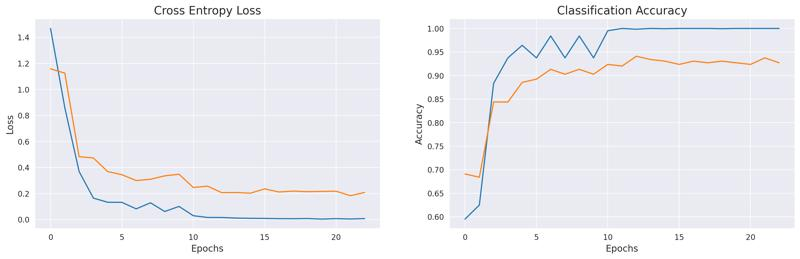

In [66]:
error = pd.DataFrame(xception_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [67]:
result = xception_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = xception_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.93      0.96        14
           1       1.00      1.00      1.00        12
           2       1.00      0.88      0.93         8
           3       1.00      1.00      1.00         7
           4       0.82      1.00      0.90         9
           5       1.00      0.80      0.89        15
           6       0.75      0.50      0.60         6
           7       0.91      0.91      0.91        11
           8       0.73      1.00      0.85        11
           9       1.00      0.85      0.92        13
           a       1.00      1.00      1.00         7
           b       0.88      0.88      0.88         8
           c       1.00      1.00      1.00         8
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00        12
           g       0.80      1.00      0.89         4
     

## **VGG16**

In [68]:
vgg = tf.keras.applications.VGG16(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet')

vgg.trainable = False
# for layer in model.layers[:-5]:
#     layer.trainable = False

vgg.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

In [69]:
vgg16_model = Sequential([
    vgg,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
vgg16_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [70]:
vgg16_history = vgg16_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 34s 355ms/step - accuracy: 0.5301 - loss: 3.0596 - val_accuracy: 0.8194 - val_loss: 0.9472 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - accuracy: 0.8750 - loss: 0.2350

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.8750 - loss: 0.2350 - val_accuracy: 0.8403 - val_loss: 0.9280 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 238ms/step - accuracy: 0.9532 - loss: 0.1657 - val_accuracy: 0.8819 - val_loss: 0.5645 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.9375 - loss: 0.0935 - val_accuracy: 0.8993 - val_loss: 0.5448 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 20s 282ms/step - accuracy: 0.9825 - loss: 0.0759 - val_accuracy: 0.9444 - val_loss: 0.3315 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 1.0000 - loss: 0.0090 - val_accuracy: 0.9479 - val_loss: 0.3324 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 349ms/step - accuracy: 0.9960 - loss: 0.0154 - val_accuracy: 0.9375 - val_loss: 0.2453 - learning_rate: 0.0010
Epoch 8/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 1.0000 - loss: 0.0025 - val_accuracy

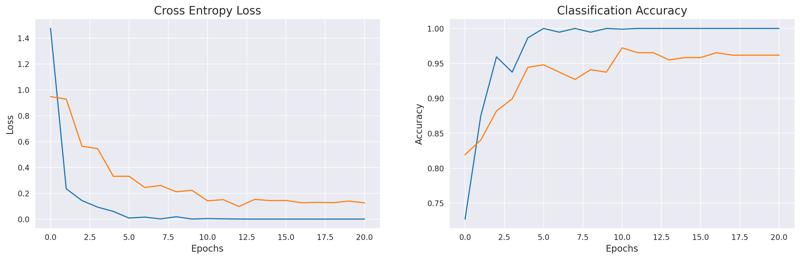

In [71]:
error = pd.DataFrame(vgg16_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [72]:
result = vgg16_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = vgg16_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78        14
           1       1.00      1.00      1.00        12
           2       0.88      0.88      0.88         8
           3       1.00      1.00      1.00         7
           4       0.75      1.00      0.86         9
           5       1.00      0.80      0.89        15
           6       0.55      1.00      0.71         6
           7       1.00      0.91      0.95        11
           8       0.92      1.00      0.96        11
           9       1.00      1.00      1.00        13
           a       1.00      1.00      1.00         7
           b       1.00      1.00      1.00         8
           c       0.89      1.00      0.94         8
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00        12
           g       1.00      1.00      1.00         4
     

## **VGG19**

In [73]:
vgg19 = tf.keras.applications.VGG19(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet')

vgg19.trainable = False
# for layer in model.layers[:-5]:
#     layer.trainable = False

vgg19.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

In [74]:
vgg19_model = Sequential([
    vgg19,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
vgg19_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [75]:
vgg19_history = vgg19_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - accuracy: 0.5329 - loss: 3.1657 - val_accuracy: 0.8299 - val_loss: 0.9867 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - accuracy: 1.0000 - loss: 0.0355

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 1.0000 - loss: 0.0355 - val_accuracy: 0.8299 - val_loss: 0.9601 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 340ms/step - accuracy: 0.9594 - loss: 0.1150 - val_accuracy: 0.8229 - val_loss: 0.5942 - learning_rate: 0.0010
Epoch 4/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 11s 196ms/step - accuracy: 0.9688 - loss: 0.2352
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - accuracy: 0.9688 - loss: 0.2352 - val_accuracy: 0.8299 - val_loss: 0.5764 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 32s 236ms/step - accuracy: 0.9815 - loss: 0.0412 - val_accuracy: 0.9479 - val_loss: 0.2933 - learning_rate: 3.0000e-04
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 1.0000 - loss: 0.0175 - val_accuracy: 0.9514 - val_loss: 0.2826 - learning_rate: 3.0000e-04
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 348ms/step - accuracy: 0.9981 - loss: 0.0091 - val

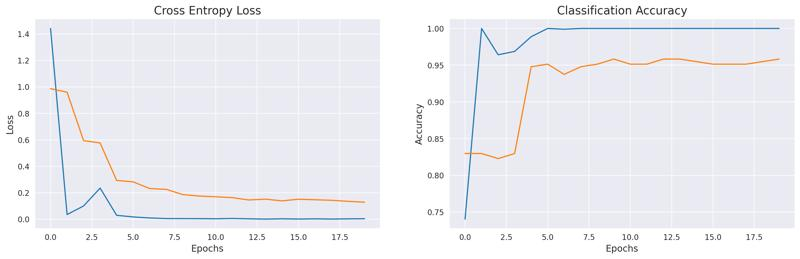

In [76]:
error = pd.DataFrame(vgg19_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [77]:
result = vgg19_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = vgg19_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.64      0.78        14
           1       1.00      0.92      0.96        12
           2       0.88      0.88      0.88         8
           3       1.00      1.00      1.00         7
           4       0.69      1.00      0.82         9
           5       1.00      0.73      0.85        15
           6       0.62      0.83      0.71         6
           7       1.00      0.91      0.95        11
           8       0.85      1.00      0.92        11
           9       1.00      1.00      1.00        13
           a       1.00      1.00      1.00         7
           b       1.00      1.00      1.00         8
           c       1.00      1.00      1.00         8
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00        12
           g       1.00      1.00      1.00         4
     

## **ResNet50**

In [78]:
resnet = tf.keras.applications.ResNet50(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
resnet.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_7[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [79]:
model_50 = Sequential([
    resnet,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_50.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [80]:
history_50 = model_50.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 105s 764ms/step - accuracy: 0.3543 - loss: 8.8450 - val_accuracy: 0.0347 - val_loss: 458.6800 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 15s 274ms/step - accuracy: 0.8750 - loss: 0.3155

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8750 - loss: 0.3155 - val_accuracy: 0.0278 - val_loss: 460.0345 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 18s 308ms/step - accuracy: 0.8671 - loss: 0.5019 - val_accuracy: 0.0347 - val_loss: 7.0670 - learning_rate: 0.0010
Epoch 4/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 16s 277ms/step - accuracy: 0.8750 - loss: 1.4010
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8750 - loss: 1.4010 - val_accuracy: 0.0347 - val_loss: 7.0466 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 340ms/step - accuracy: 0.9267 - loss: 0.3046 - val_accuracy: 0.0278 - val_loss: 6.6629 - learning_rate: 3.0000e-04
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - accuracy: 1.0000 - loss: 0.0061 - val_accuracy: 0.0347 - val_loss: 6.6355 - learning_rate: 3.0000e-04
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - accuracy: 0.9935 - loss: 0.0302
Epoc

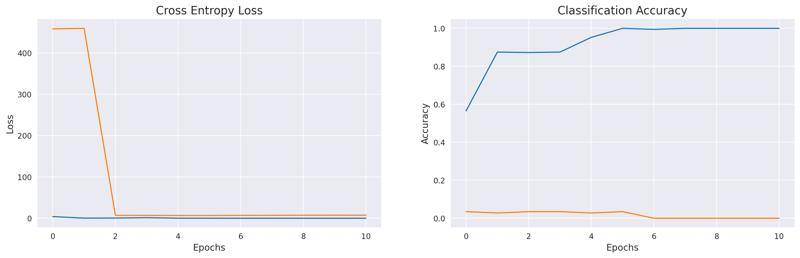

In [81]:
error = pd.DataFrame(history_50.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [82]:
result = model_50.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_50.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

Classification Report
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.00      0.00      0.00        12
           2       0.00      0.00      0.00         8
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        15
           6       0.00      0.00      0.00         6
           7       0.00      0.00      0.00        11
           8       0.00      0.00      0.00        11
           9       0.00      0.00      0.00        13
           a       0.00      0.00      0.00         7
           b       0.00      0.00      0.00         8
           c       0.00      0.00      0.00         8
           d       0.00      0.00      0.00         9
           e       0.00      0.00      0.00         7
           f       0.00      0.00      0.00        12
           g       0.00      0.00      0.00         4
     

## **ResNet50V2**

In [83]:
resnetv2 = tf.keras.applications.ResNet50V2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
resnetv2.summary()

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_9[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 56, 56,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 56, 56,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 58, 58,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 56, 56,    │          0 │ conv2_block1_0_c

 Total params: 23,564,800 (89.89 MB)

 Trainable params: 23,519,360 (89.72 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [84]:
model_50v2 = Sequential([
    resnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_50v2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [85]:
history_50v2 = model_50v2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 94s 718ms/step - accuracy: 0.3132 - loss: 4.8604 - val_accuracy: 0.0104 - val_loss: 437.5931 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 13s 234ms/step - accuracy: 0.6875 - loss: 0.8967

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.6875 - loss: 0.8967 - val_accuracy: 0.0139 - val_loss: 347.6826 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 16s 272ms/step - accuracy: 0.8590 - loss: 0.5109 - val_accuracy: 0.2292 - val_loss: 25.8281 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.8125 - loss: 1.0754 - val_accuracy: 0.2465 - val_loss: 26.1595 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 19s 273ms/step - accuracy: 0.8856 - loss: 0.4129 - val_accuracy: 0.8125 - val_loss: 0.6598 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8438 - loss: 0.5851 - val_accuracy: 0.7917 - val_loss: 0.7162 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 16s 269ms/step - accuracy: 0.9472 - loss: 0.1943 - val_accuracy: 0.7882 - val_loss: 0.8354 - learning_rate: 0.0010
Epoch 8/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - accuracy: 0.9062 - loss: 0.2800
Epoch 8:

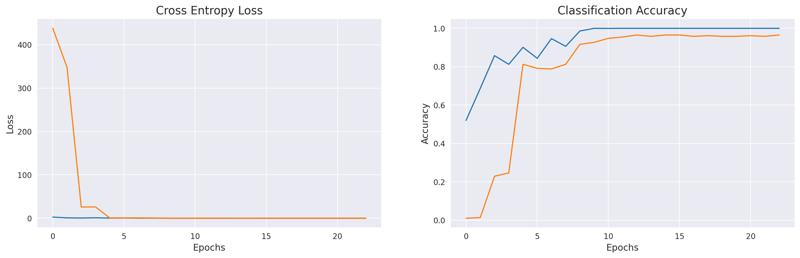

In [86]:
error = pd.DataFrame(history_50v2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [87]:
result = model_50v2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_50v2.evaluate(test_generator,verbose = 0)
print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.93      0.96        14
           1       0.92      1.00      0.96        12
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00         7
           4       0.75      1.00      0.86         9
           5       1.00      0.80      0.89        15
           6       1.00      0.67      0.80         6
           7       1.00      0.91      0.95        11
           8       0.92      1.00      0.96        11
           9       1.00      1.00      1.00        13
           a       1.00      1.00      1.00         7
           b       1.00      1.00      1.00         8
           c       1.00      1.00      1.00         8
           d       1.00      0.89      0.94         9
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00        12
           g       1.00      1.00      1.00         4
     

## **InceptionResNetV2**

In [88]:
irv2 = tf.keras.applications.InceptionResNetV2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
irv2.summary()

219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "inception_resnet_v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_124 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_11[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_124[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_94       │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_125 (Conv2D) │ (None, 109, 109,  │      9,216 │ activation_94[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_125[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_95       │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_126 (Conv2D) │ (None, 109, 109,  │     18,432 │ activation_95[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_126[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_96       │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_10    │ (None, 54, 54,    │          0 │ activation_96[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_127 (Conv2D) │ (None, 54, 54,    │      5,120 │ max_pooling2d_10… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_127[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_97       │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_128 (Conv2D) │ (None, 52, 52,    │    138,240 │ activation_97[0]… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_128[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_98       │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 54,336,736 (207.28 MB)

 Trainable params: 54,276,192 (207.05 MB)

 Non-trainable params: 60,544 (236.50 KB)

In [89]:
model_irv2 = Sequential([
    resnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_irv2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [90]:
history_irv2 = model_irv2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 86s 659ms/step - accuracy: 0.5205 - loss: 3.8645 - val_accuracy: 0.0417 - val_loss: 4827.0381 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 14s 243ms/step - accuracy: 0.7500 - loss: 1.0247

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - accuracy: 0.7500 - loss: 1.0247 - val_accuracy: 0.0451 - val_loss: 4840.4395 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 40s 302ms/step - accuracy: 0.8709 - loss: 0.5666 - val_accuracy: 0.0243 - val_loss: 4200.7324 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8438 - loss: 1.1101 - val_accuracy: 0.0278 - val_loss: 3330.8789 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 347ms/step - accuracy: 0.9126 - loss: 0.3892 - val_accuracy: 0.4826 - val_loss: 22.0384 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 5s 77ms/step - accuracy: 0.8750 - loss: 0.2370 - val_accuracy: 0.5278 - val_loss: 19.5829 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 32s 268ms/step - accuracy: 0.9207 - loss: 0.3004 - val_accuracy: 0.3854 - val_loss: 33.3352 - learning_rate: 0.0010
Epoch 8/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.9688 - loss: 0.0709 - 

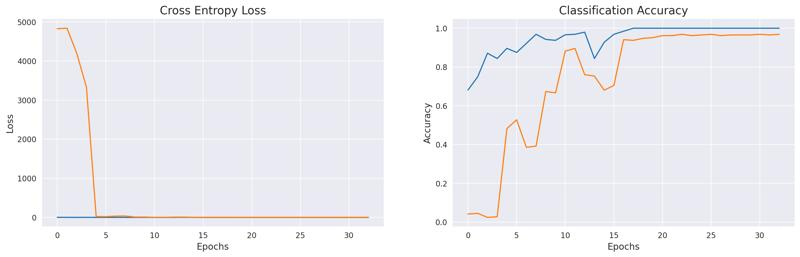

In [91]:
error = pd.DataFrame(history_irv2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [92]:
result = model_irv2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_irv2.evaluate(test_generator,verbose = 0)
print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.71      0.83        14
           1       1.00      0.92      0.96        12
           2       1.00      0.88      0.93         8
           3       1.00      1.00      1.00         7
           4       0.90      1.00      0.95         9
           5       1.00      0.93      0.97        15
           6       0.80      0.67      0.73         6
           7       1.00      1.00      1.00        11
           8       0.92      1.00      0.96        11
           9       1.00      1.00      1.00        13
           a       1.00      0.86      0.92         7
           b       1.00      0.88      0.93         8
           c       0.89      1.00      0.94         8
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00         7
           f       1.00      1.00      1.00        12
           g       1.00      1.00      1.00         4
     

## **MobileNet**

In [93]:
mnet = tf.keras.applications.MobileNet(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
mnet.summary()

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "mobilenet_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 56, 56, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 56, 56, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 56, 56, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 3,228,864 (12.32 MB)

 Trainable params: 3,206,976 (12.23 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [94]:
model_mnet = Sequential([
    mnet,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_mnet.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [95]:
history_mnet = model_mnet.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 51s 421ms/step - accuracy: 0.4984 - loss: 3.5737 - val_accuracy: 0.0903 - val_loss: 93.1962 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.8750 - loss: 0.7732

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8750 - loss: 0.7732 - val_accuracy: 0.1007 - val_loss: 92.8920 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 21s 350ms/step - accuracy: 0.8559 - loss: 0.6218 - val_accuracy: 0.3160 - val_loss: 22.5040 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.8438 - loss: 0.6268 - val_accuracy: 0.3264 - val_loss: 21.5556 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 41s 378ms/step - accuracy: 0.9387 - loss: 0.2915 - val_accuracy: 0.7917 - val_loss: 1.5087 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.8438 - loss: 0.6915 - val_accuracy: 0.8438 - val_loss: 1.2326 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 41s 405ms/step - accuracy: 0.9311 - loss: 0.3060 - val_accuracy: 0.7986 - val_loss: 0.7985 - learning_rate: 0.0010
Epoch 8/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.9375 - loss: 0.1783 - val_accur

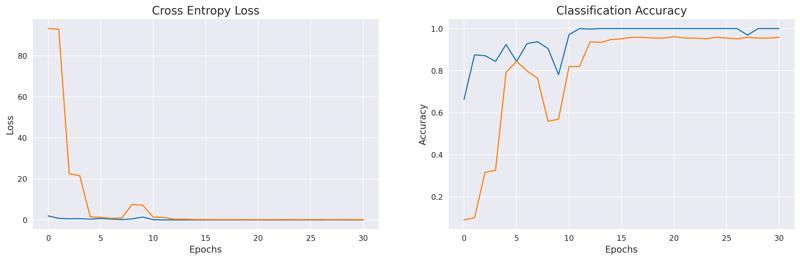

In [96]:
error = pd.DataFrame(history_mnet.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [97]:
result = model_mnet.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_mnet.evaluate(test_generator,verbose = 0)

print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.93      0.93      0.93        14
           1       1.00      0.92      0.96        12
           2       1.00      0.88      0.93         8
           3       1.00      1.00      1.00         7
           4       0.69      1.00      0.82         9
           5       1.00      0.73      0.85        15
           6       0.75      1.00      0.86         6
           7       1.00      0.91      0.95        11
           8       1.00      1.00      1.00        11
           9       1.00      1.00      1.00        13
           a       1.00      0.86      0.92         7
           b       1.00      1.00      1.00         8
           c       1.00      1.00      1.00         8
           d       1.00      1.00      1.00         9
           e       0.88      1.00      0.93         7
           f       1.00      1.00      1.00        12
           g       1.00      1.00      1.00         4
     

## **MobileNetV2**

In [98]:
mnetv2 = tf.keras.applications.MobileNetV2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
mnetv2.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_15[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [99]:
model_mnetv2 = Sequential([
    mnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_mnetv2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [100]:
history_mnetv2 = model_mnetv2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 83s 602ms/step - accuracy: 0.3398 - loss: 7.8031 - val_accuracy: 0.0278 - val_loss: 1332.9525 - learning_rate: 0.0010
Epoch 2/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - accuracy: 0.9375 - loss: 0.2728

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9375 - loss: 0.2728 - val_accuracy: 0.0278 - val_loss: 1346.3821 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 41s 301ms/step - accuracy: 0.8608 - loss: 0.5590 - val_accuracy: 0.0278 - val_loss: 1041.4093 - learning_rate: 0.0010
Epoch 4/50
 1/59 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.9688 - loss: 0.2062
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.9688 - loss: 0.2062 - val_accuracy: 0.0243 - val_loss: 1030.4089 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 12s 203ms/step - accuracy: 0.9300 - loss: 0.2019 - val_accuracy: 0.0243 - val_loss: 1098.1588 - learning_rate: 3.0000e-04
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 1.0000 - loss: 0.0385 - val_accuracy: 0.0243 - val_loss: 1101.1605 - learning_rate: 3.0000e-04
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - accuracy: 0.9791 - loss:

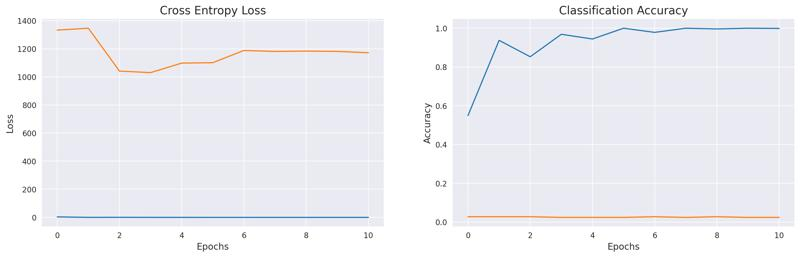

In [101]:
error = pd.DataFrame(history_mnetv2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [102]:
result = model_mnetv2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_mnetv2.evaluate(test_generator,verbose = 0)

print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

Classification Report
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.00      0.00      0.00        12
           2       0.00      0.00      0.00         8
           3       0.00      0.00      0.00         7
           4       0.00      0.00      0.00         9
           5       0.00      0.00      0.00        15
           6       0.00      0.00      0.00         6
           7       0.00      0.00      0.00        11
           8       0.00      0.00      0.00        11
           9       0.00      0.00      0.00        13
           a       0.00      0.00      0.00         7
           b       0.00      0.00      0.00         8
           c       0.00      0.00      0.00         8
           d       0.00      0.00      0.00         9
           e       0.00      0.00      0.00         7
           f       0.00      0.00      0.00        12
           g       0.00      0.00      0.00         4
     

## **Prediction**

In [103]:
class_map = train_generator.class_indices
classes = []
for key in class_map.keys():
    classes.append(key)

In [104]:
def predict_image(filename, model):
    img_ = image.load_img(filename, target_size=(224, 224))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(str(classes[index]).title()), size=18, color='red')
    plt.imshow(img_array)

# **SqueezeNet**

In [105]:
model = squeezenet_model

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


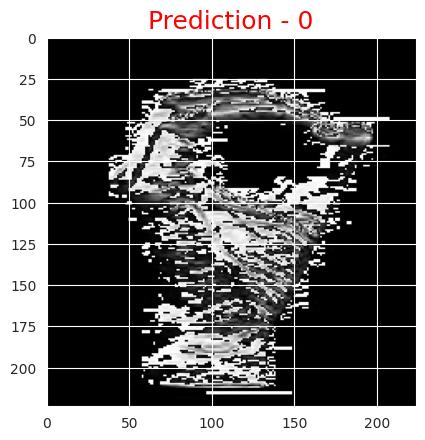

In [106]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


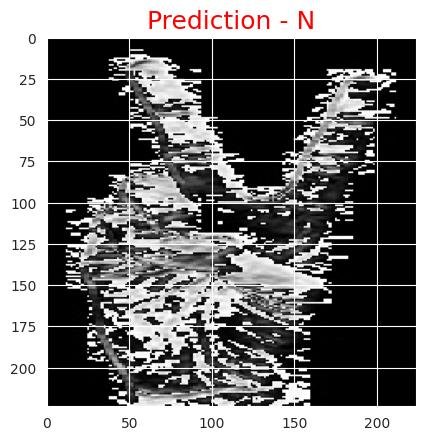

In [107]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


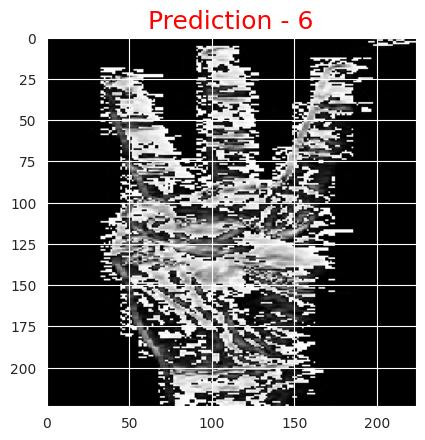

In [108]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


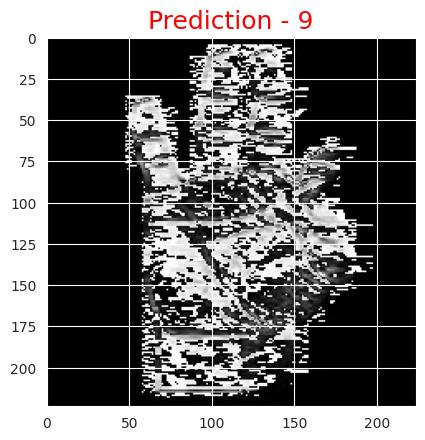

In [109]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


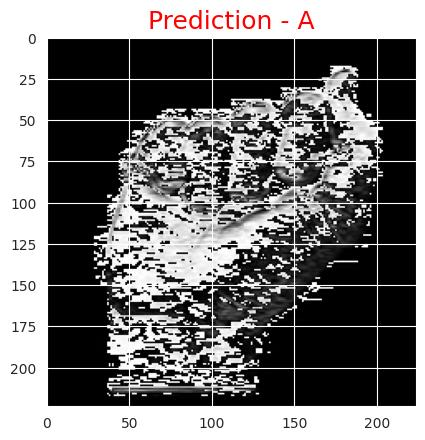

In [110]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


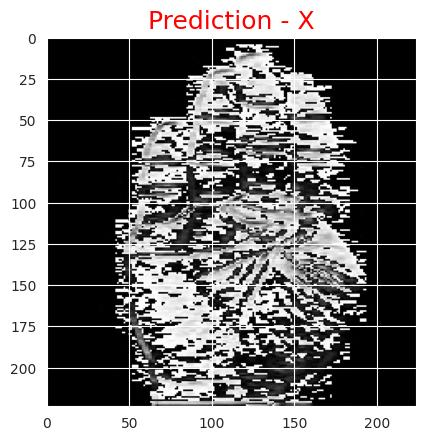

In [111]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


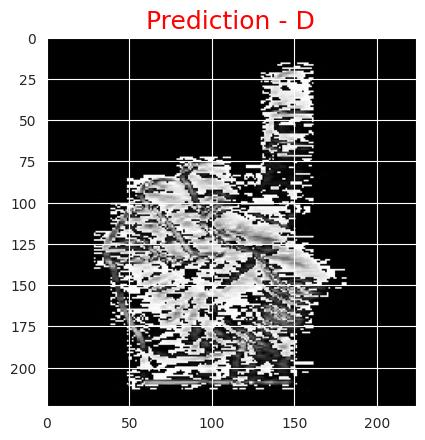

In [112]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


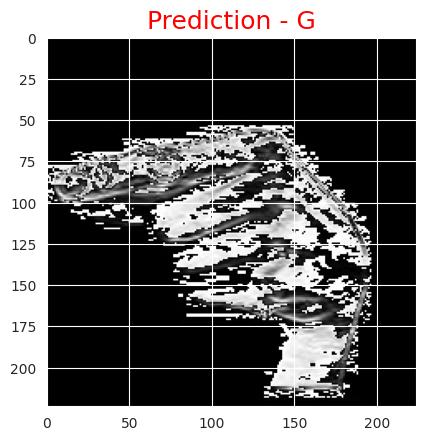

In [113]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


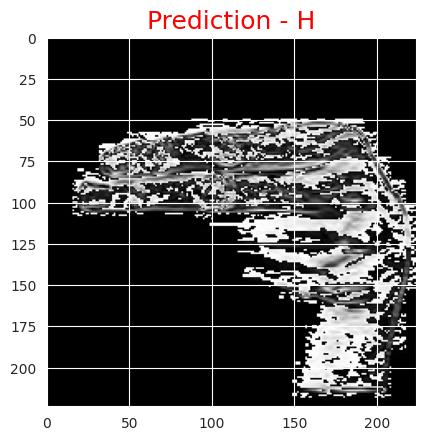

In [114]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


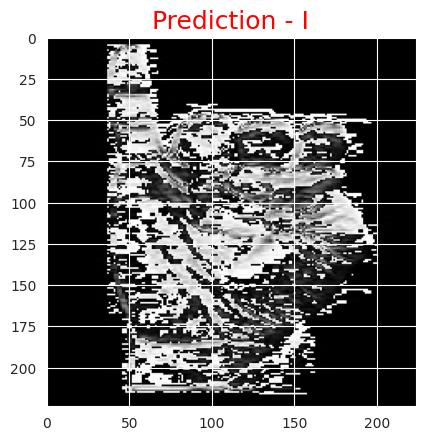

In [115]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


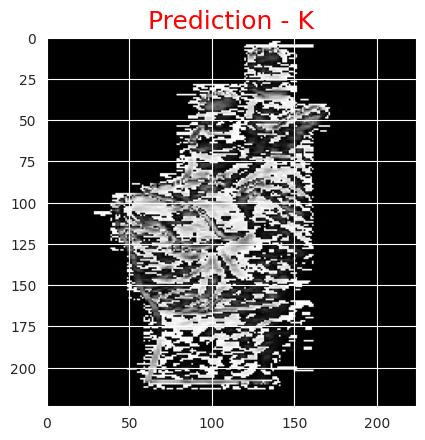

In [116]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


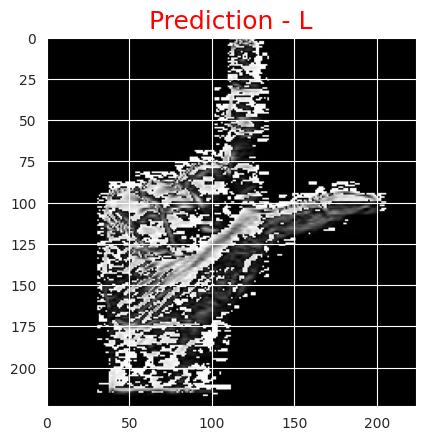

In [117]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


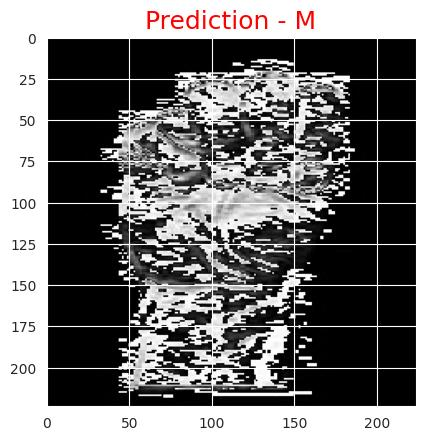

In [118]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


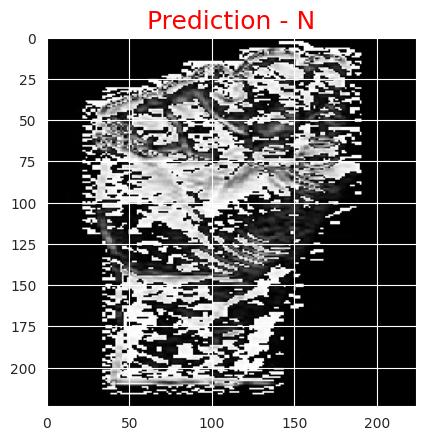

In [119]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


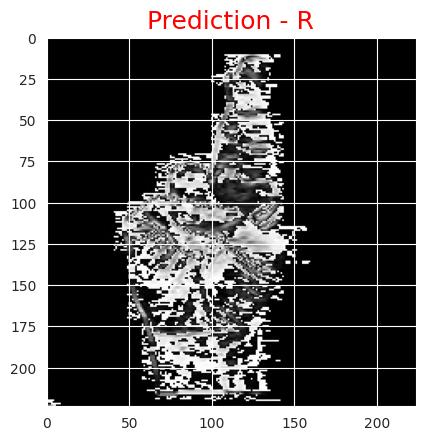

In [120]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


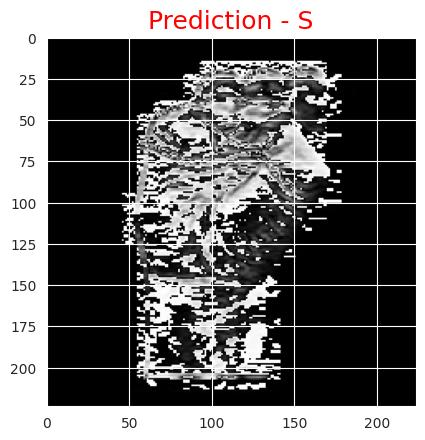

In [121]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


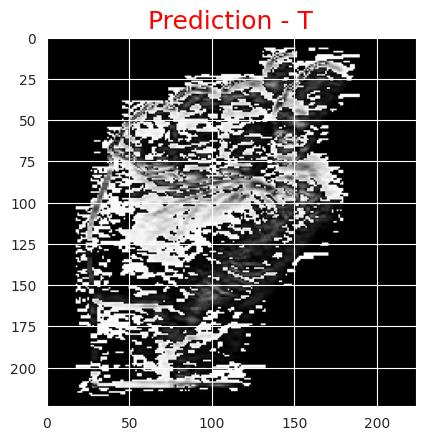

In [122]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


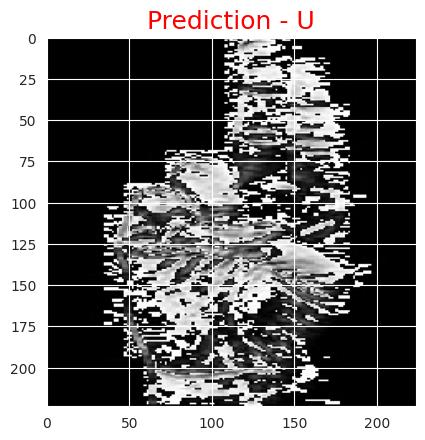

In [123]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


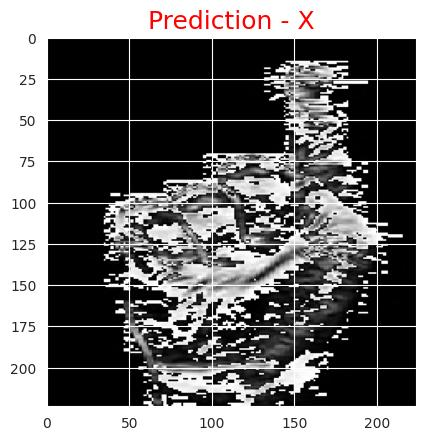

In [124]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


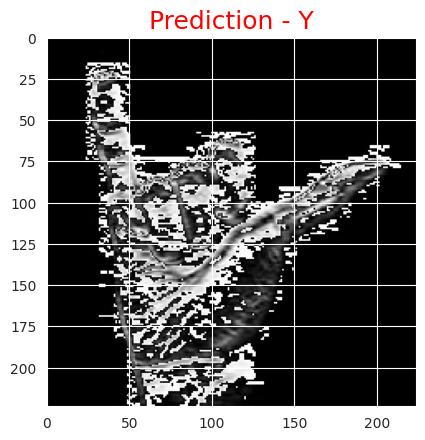

In [125]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **InceptionV3**

In [126]:
model = inception_model

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


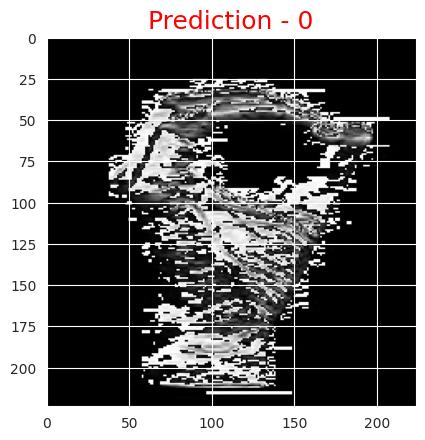

In [127]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


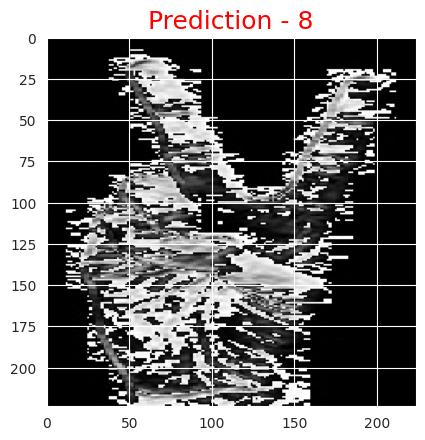

In [128]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


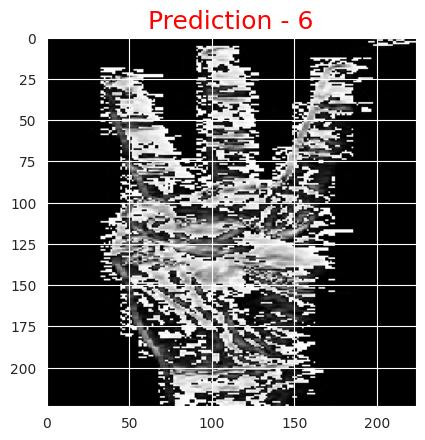

In [129]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


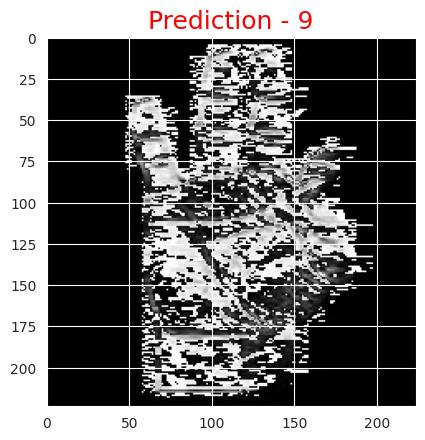

In [130]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


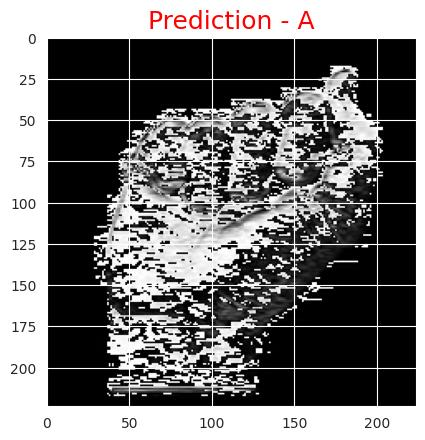

In [131]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


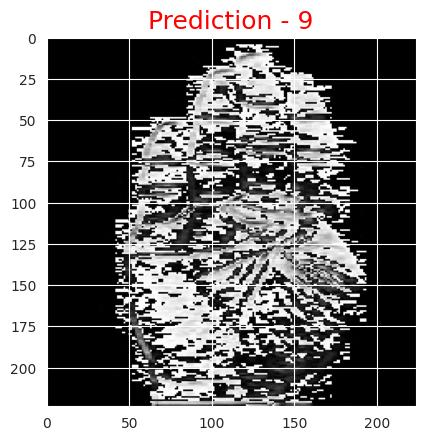

In [132]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


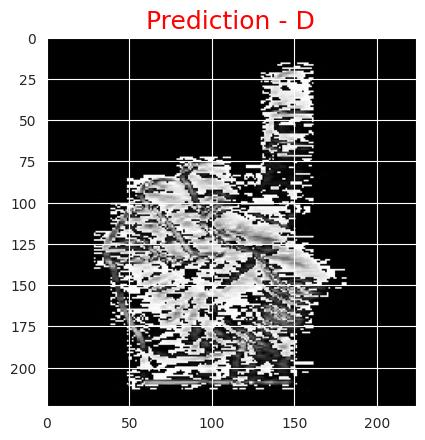

In [133]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


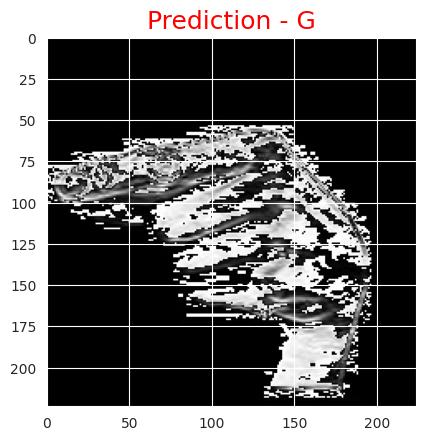

In [134]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


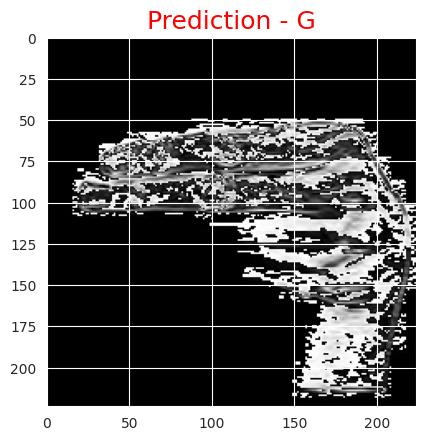

In [135]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


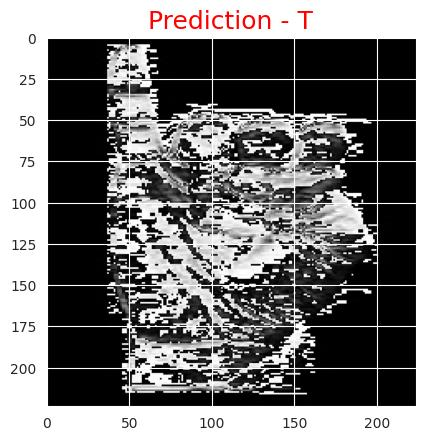

In [136]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


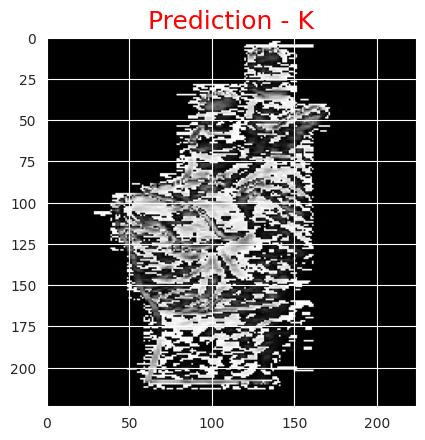

In [137]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


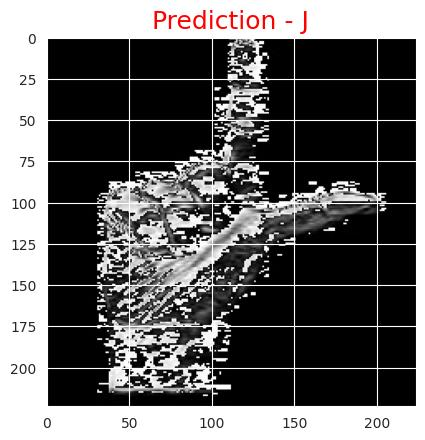

In [138]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


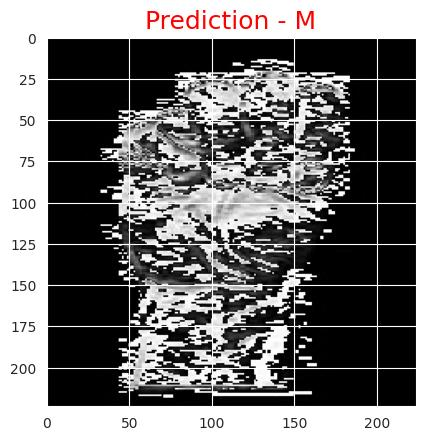

In [139]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


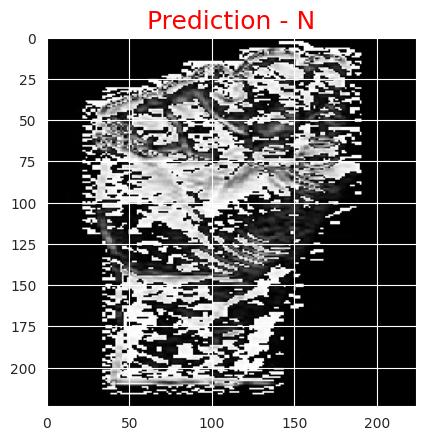

In [140]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


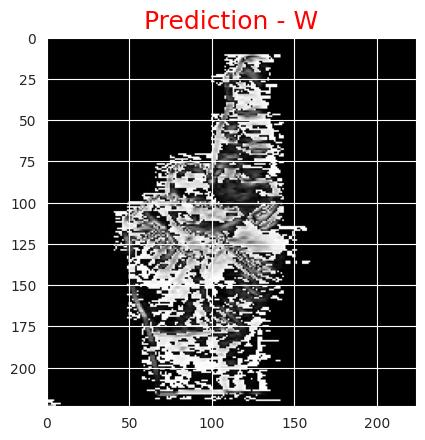

In [141]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


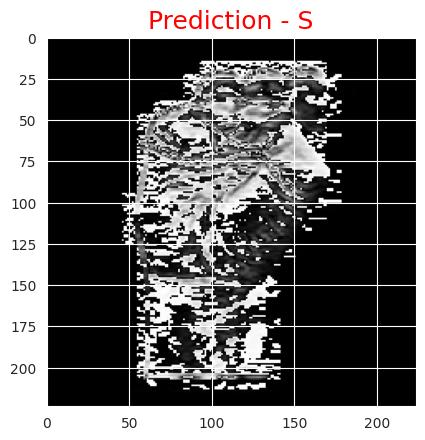

In [142]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


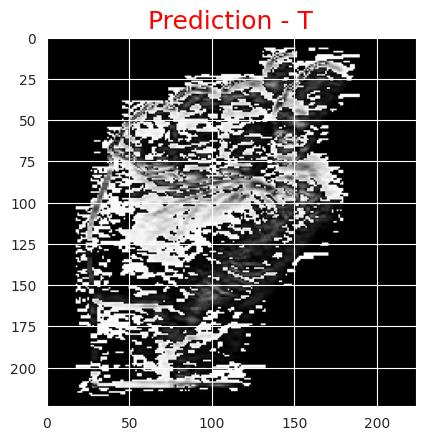

In [143]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


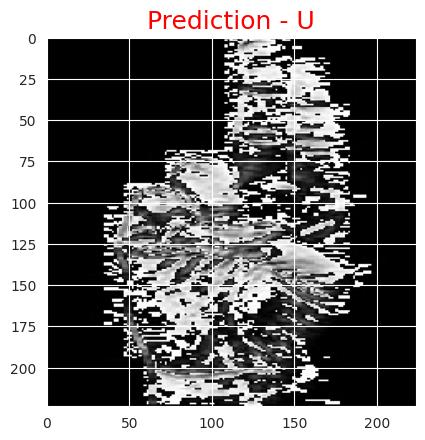

In [144]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


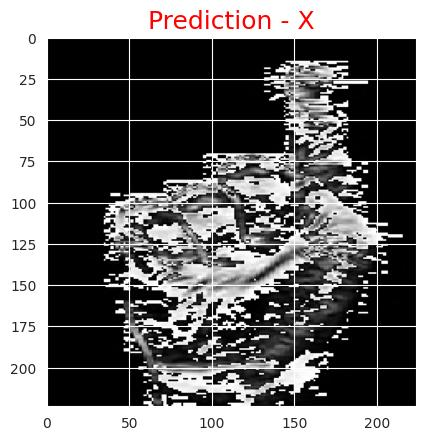

In [145]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


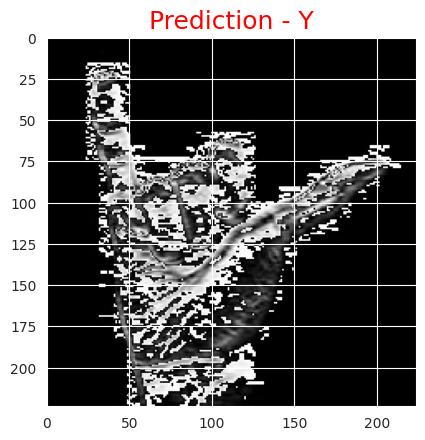

In [146]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **Xception**

In [147]:
model = xception_model

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


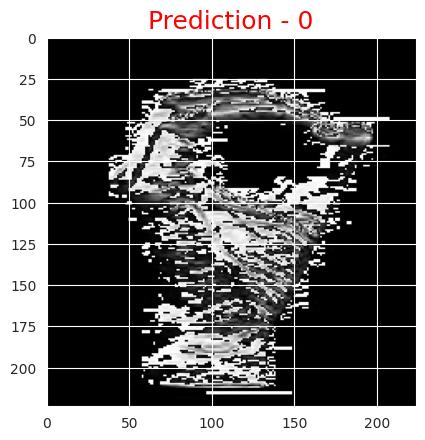

In [148]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


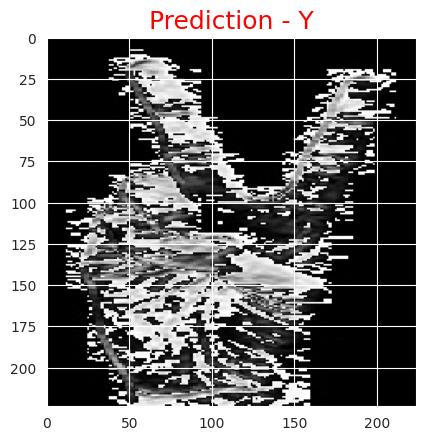

In [149]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


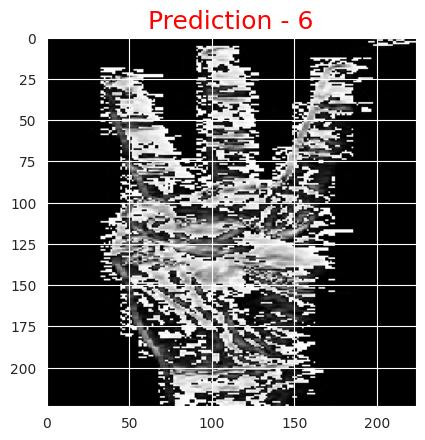

In [150]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


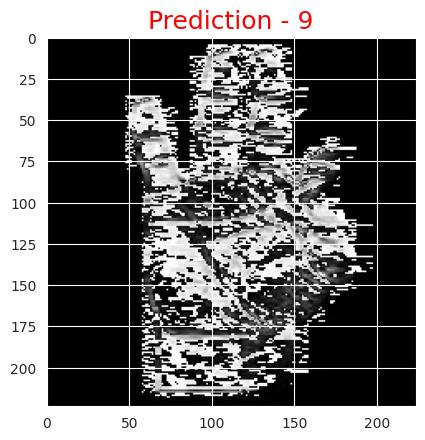

In [151]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


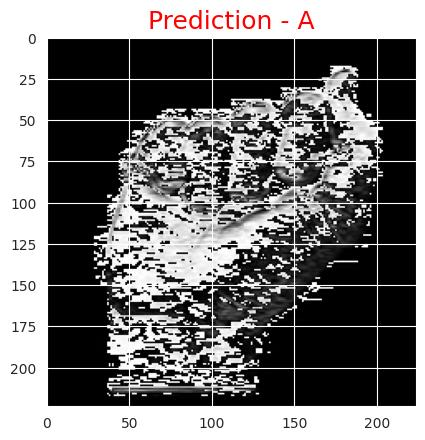

In [152]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


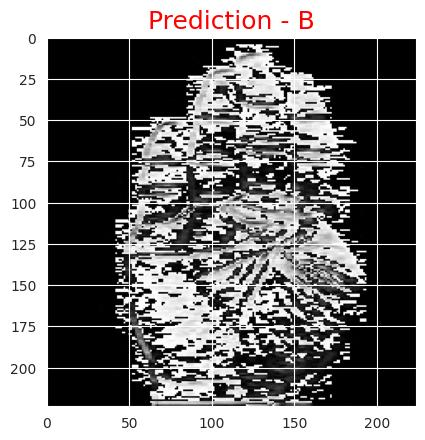

In [153]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


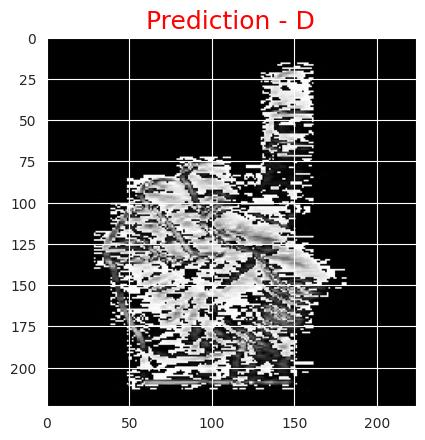

In [154]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


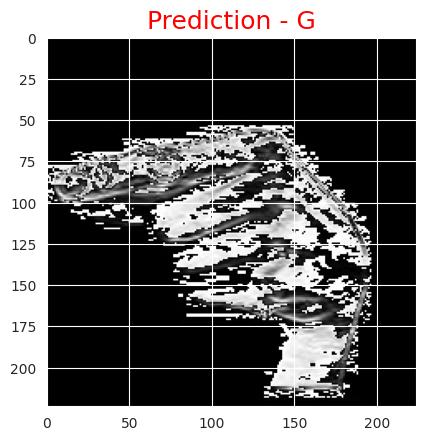

In [155]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


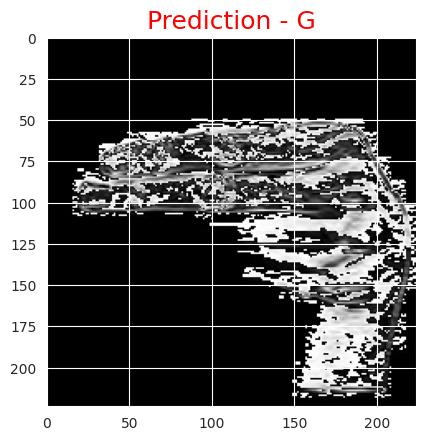

In [156]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


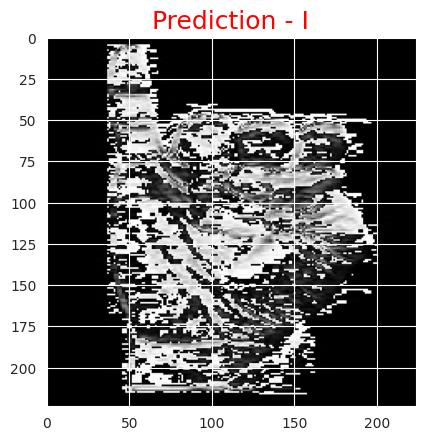

In [157]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


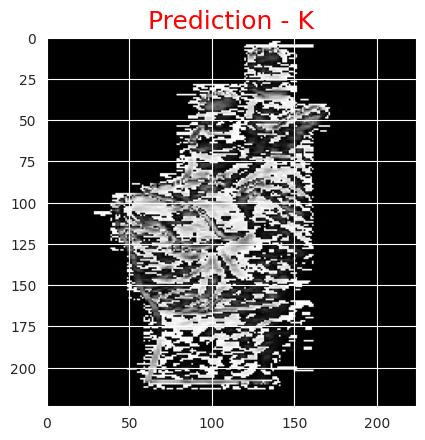

In [158]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


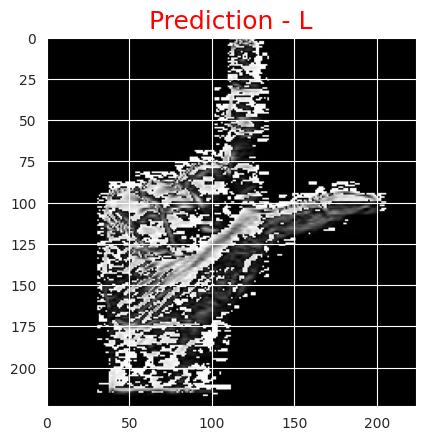

In [159]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


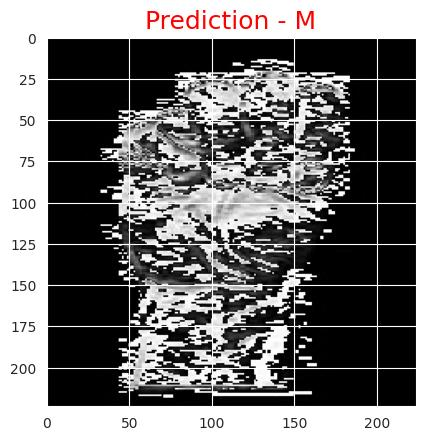

In [160]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


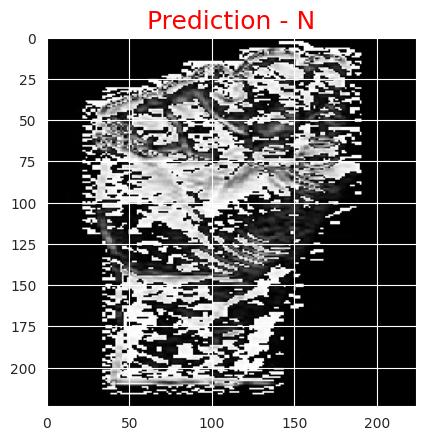

In [161]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


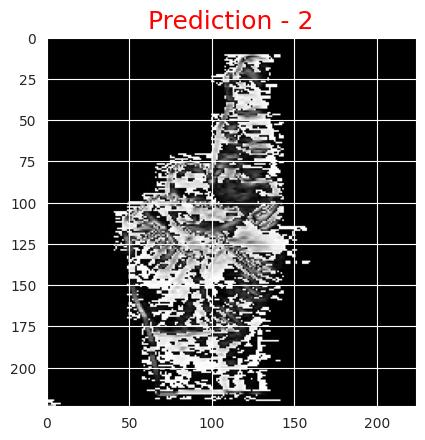

In [162]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


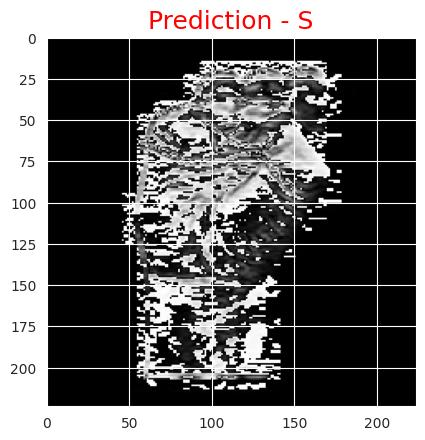

In [163]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


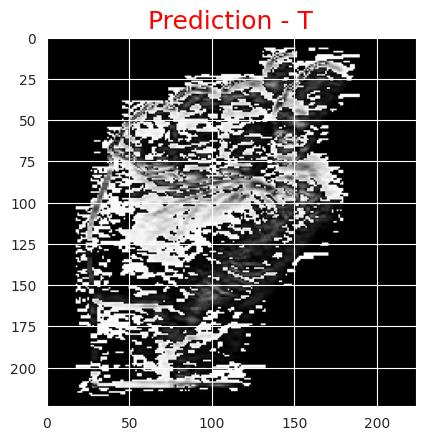

In [164]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


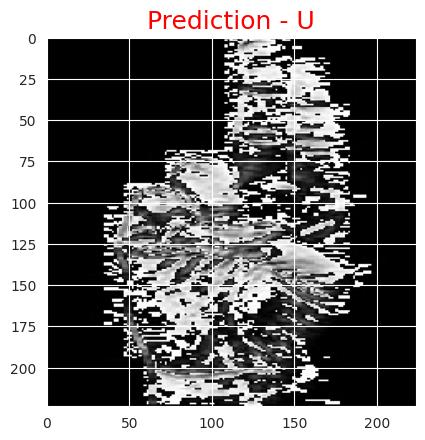

In [165]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


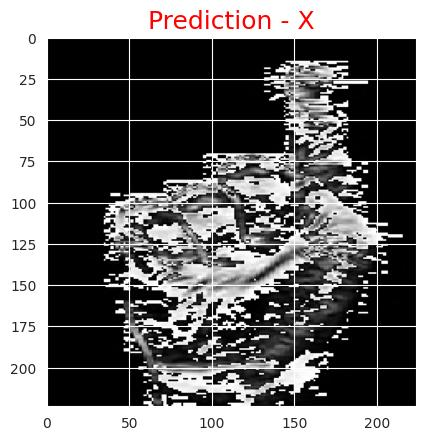

In [166]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


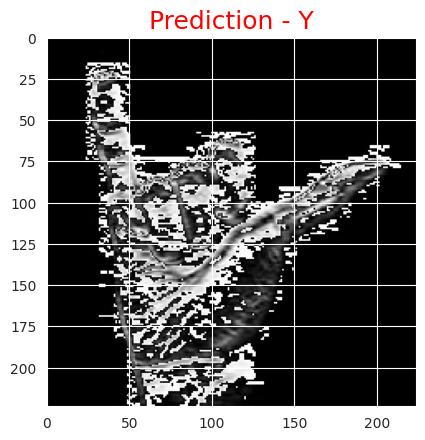

In [167]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **VGG16**

In [168]:
model = vgg16_model

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 717ms/step


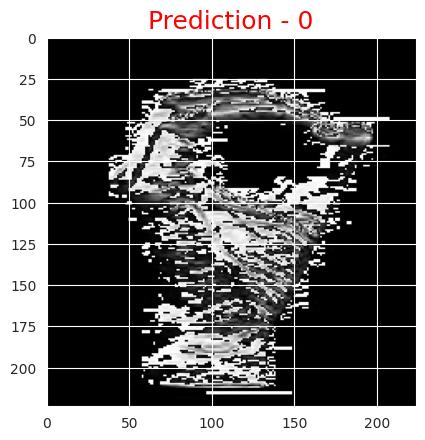

In [169]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


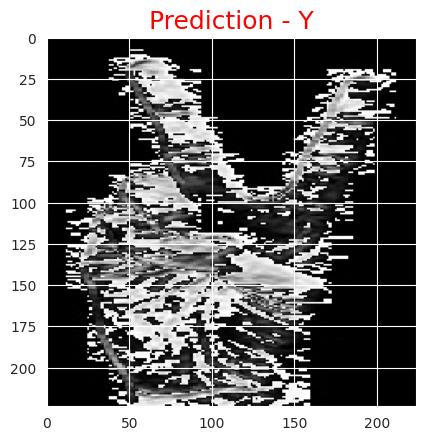

In [170]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


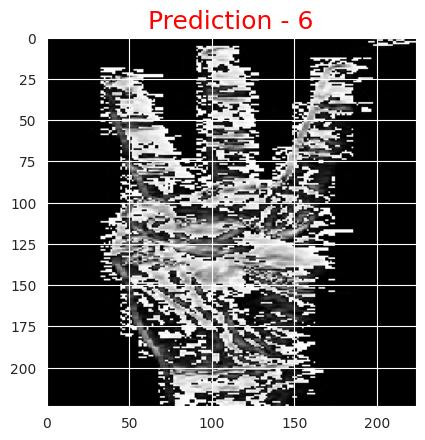

In [171]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


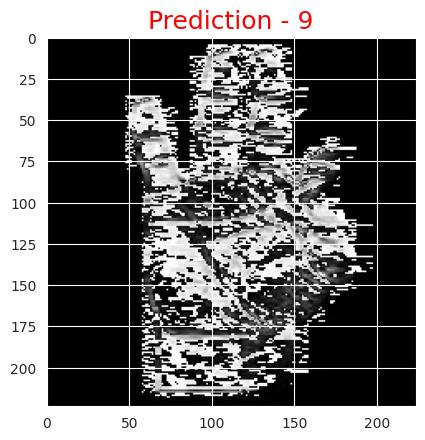

In [172]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


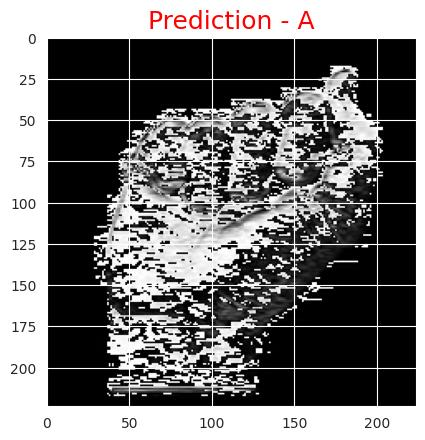

In [173]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


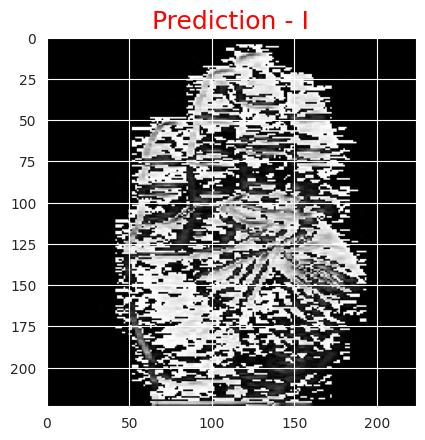

In [174]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


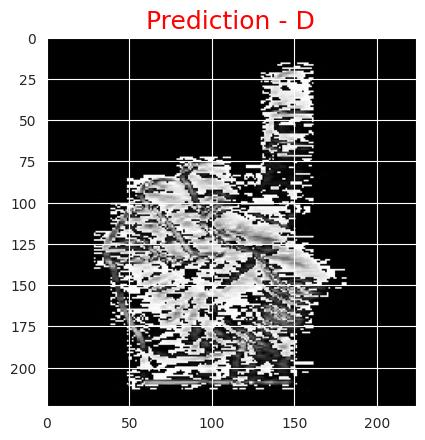

In [175]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


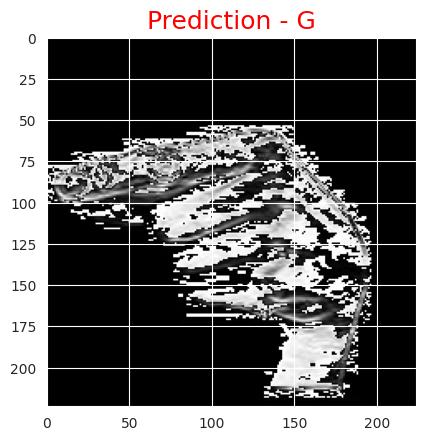

In [176]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


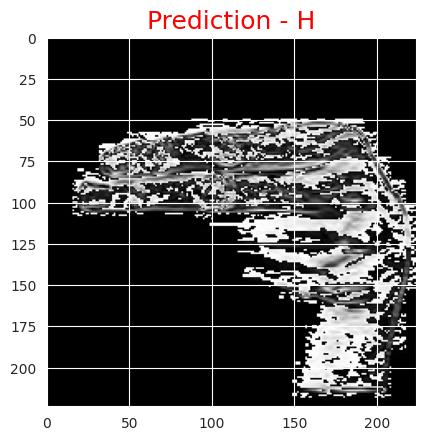

In [177]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


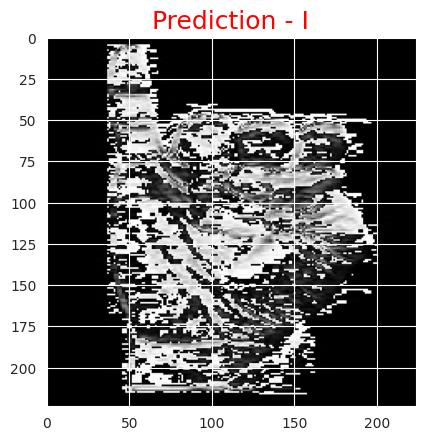

In [178]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


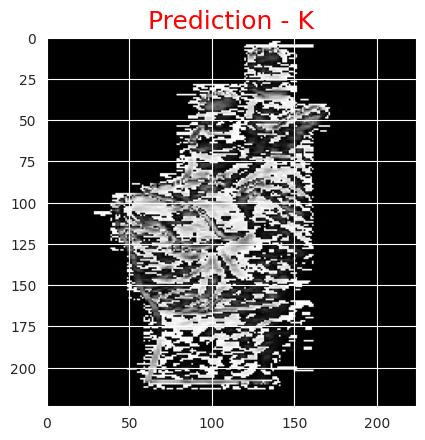

In [179]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


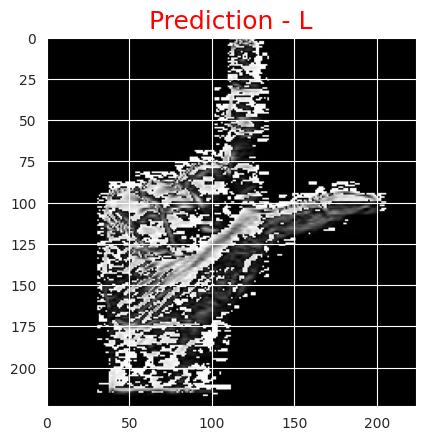

In [180]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


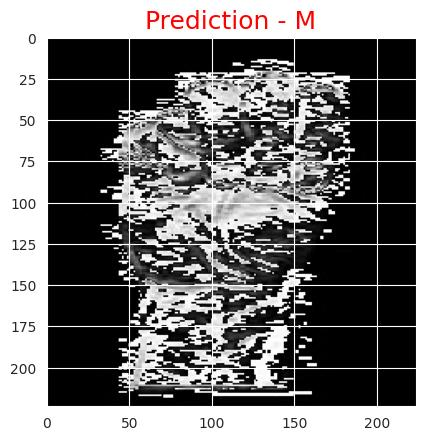

In [181]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


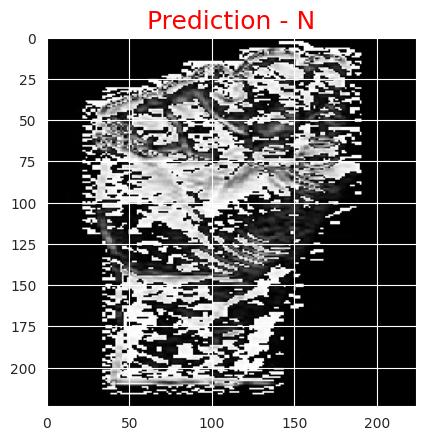

In [182]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


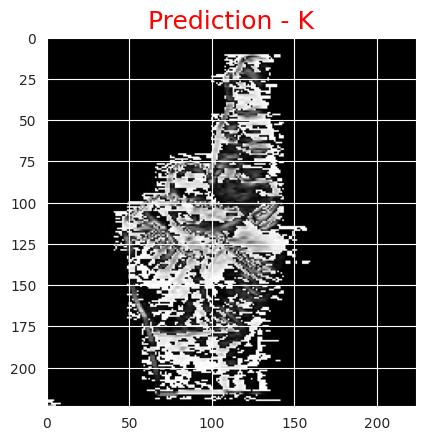

In [183]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


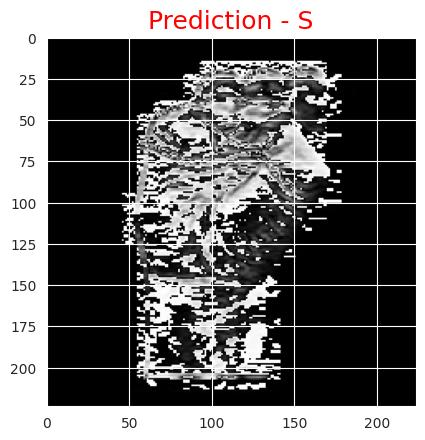

In [184]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


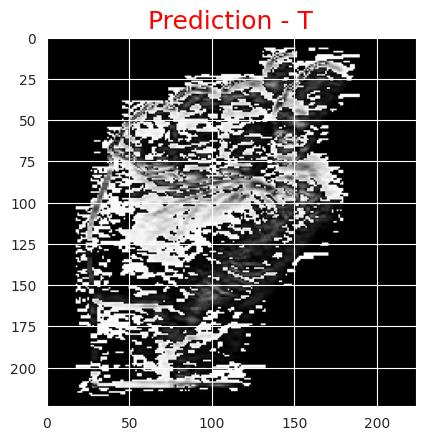

In [185]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


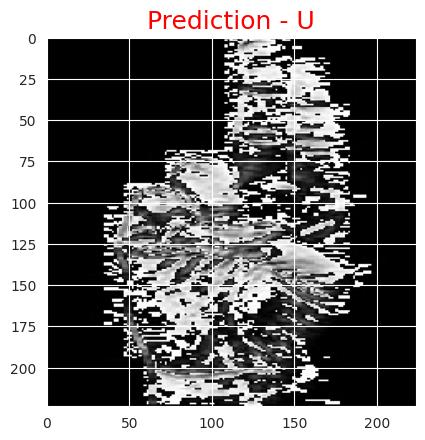

In [186]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


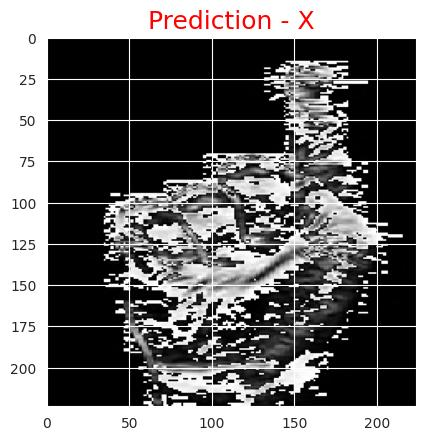

In [187]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


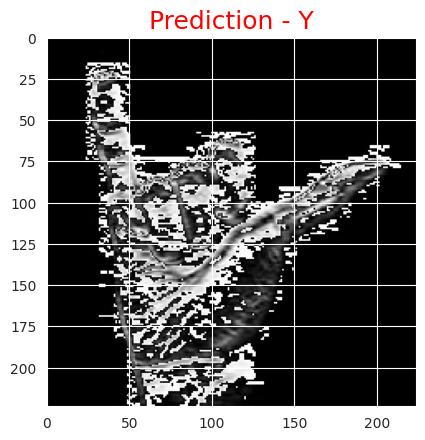

In [188]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **VGG19**

In [189]:
model = vgg19_model

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


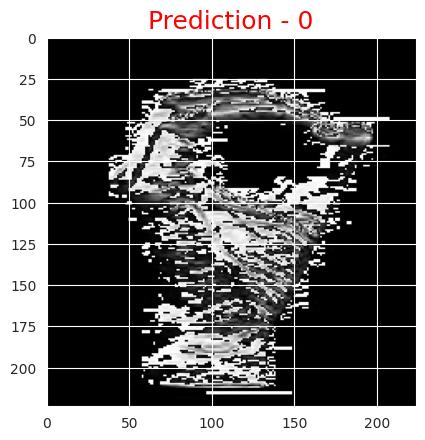

In [190]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


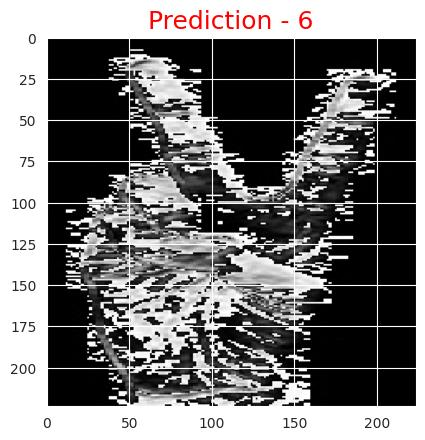

In [191]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


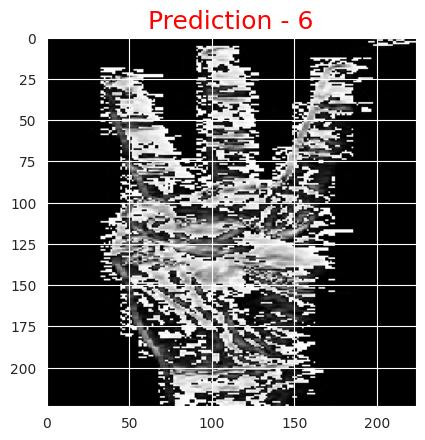

In [192]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


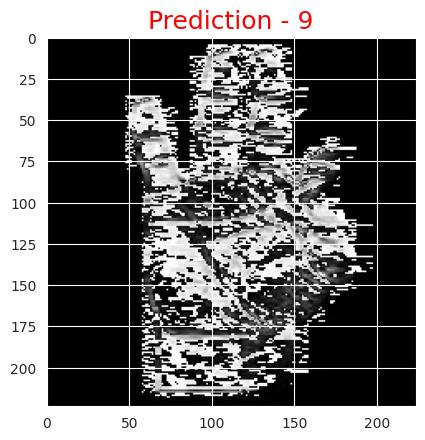

In [193]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


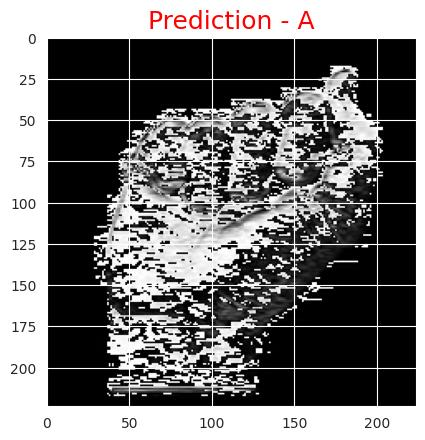

In [194]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


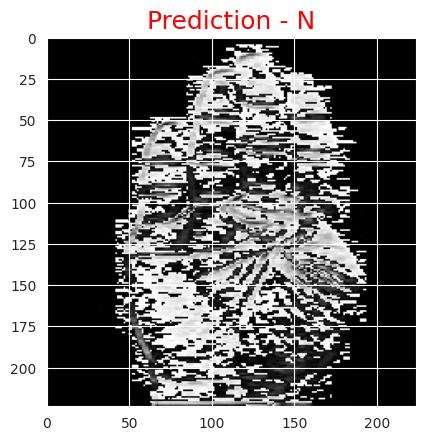

In [195]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


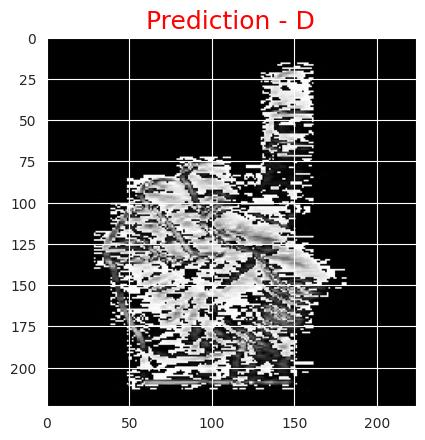

In [196]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


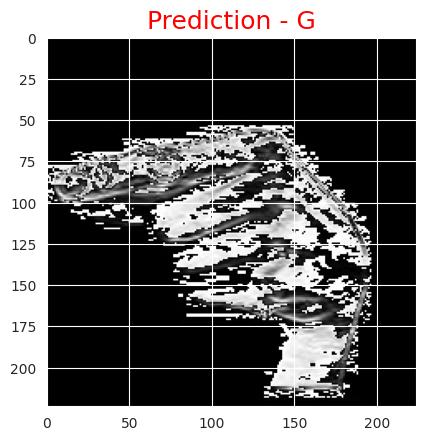

In [197]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


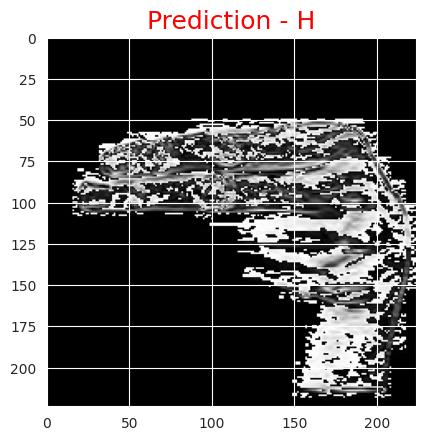

In [198]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


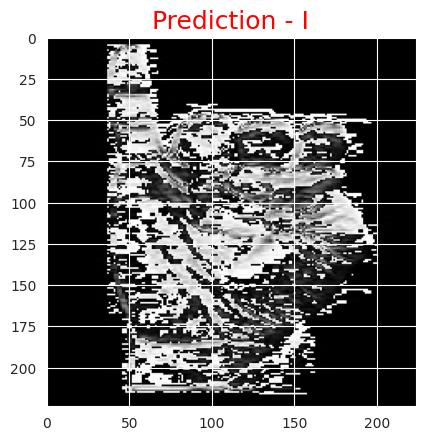

In [199]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


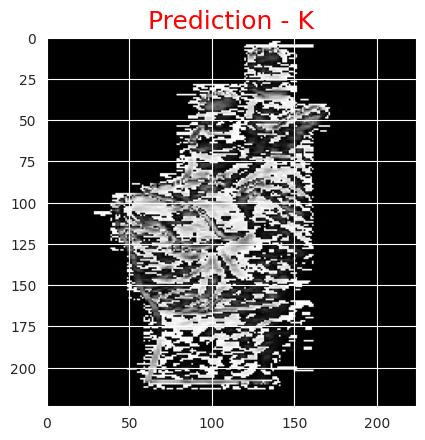

In [200]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


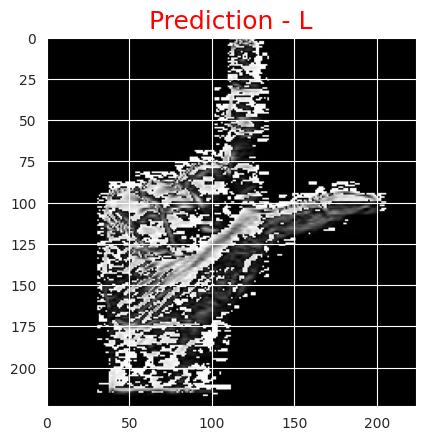

In [201]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


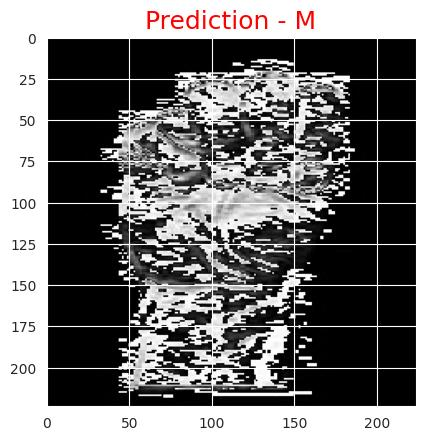

In [202]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


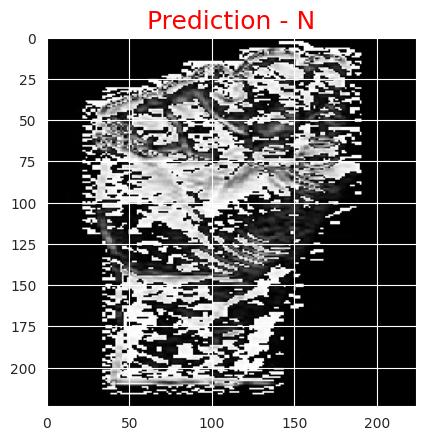

In [203]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


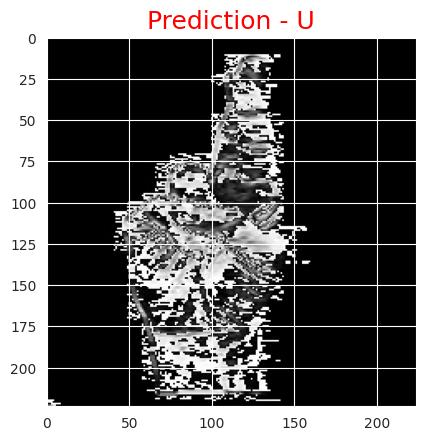

In [204]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


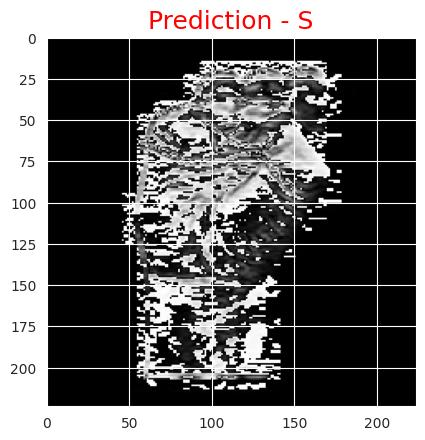

In [205]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


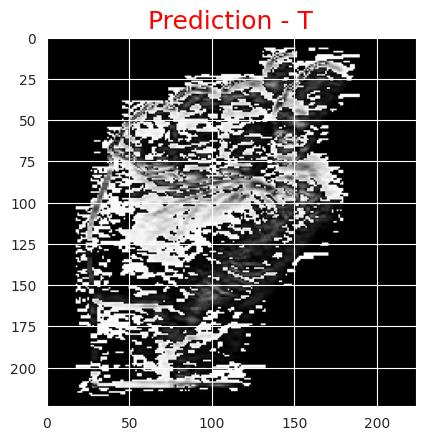

In [206]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


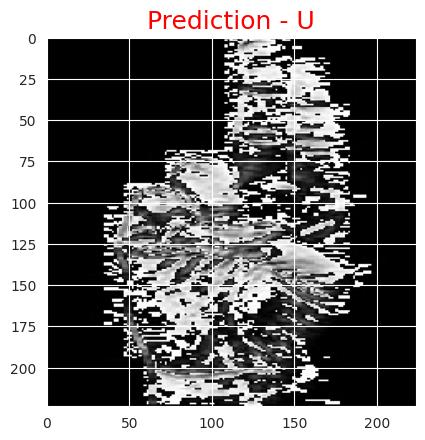

In [207]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


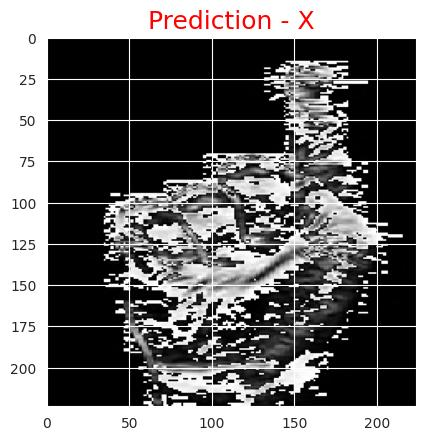

In [208]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


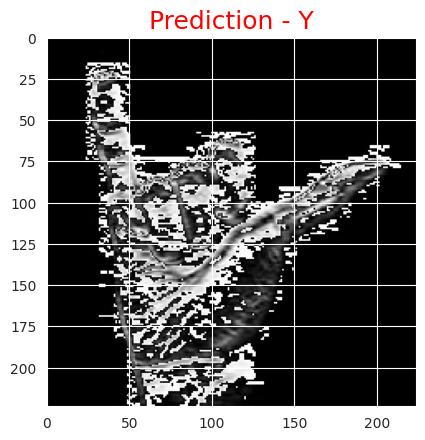

In [209]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **ResNet50**

In [210]:
model = model_50

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


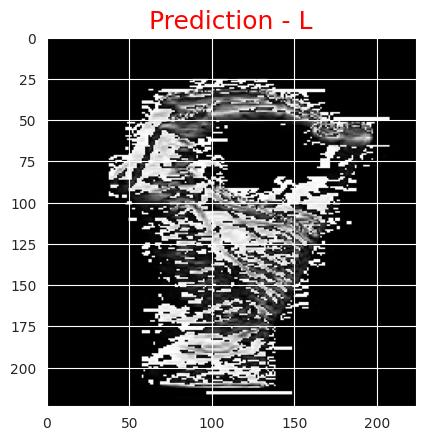

In [211]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


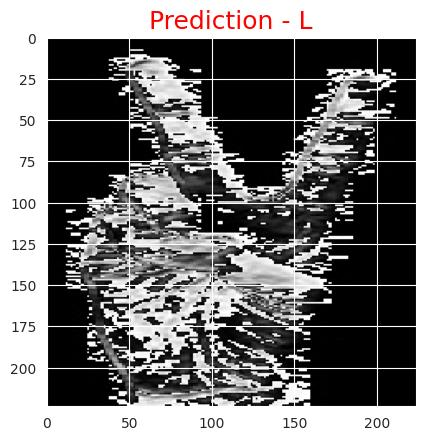

In [212]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


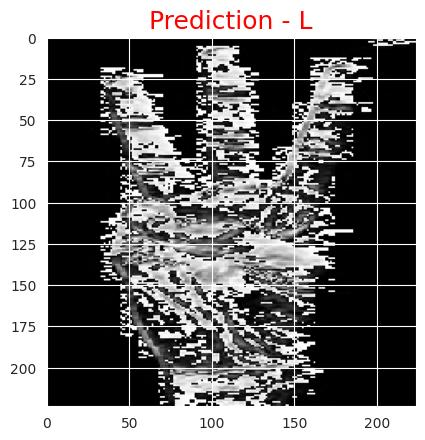

In [213]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


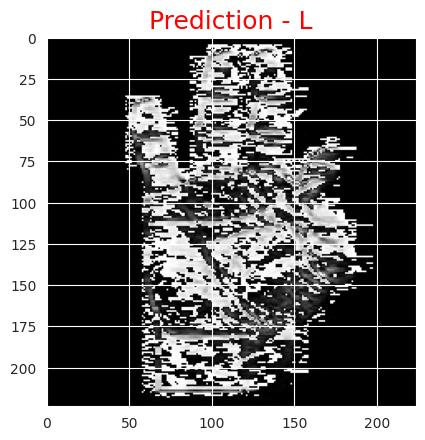

In [214]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


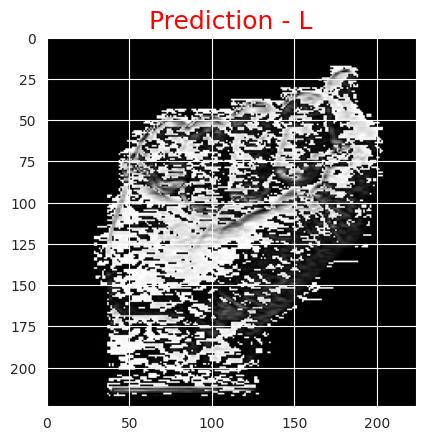

In [215]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


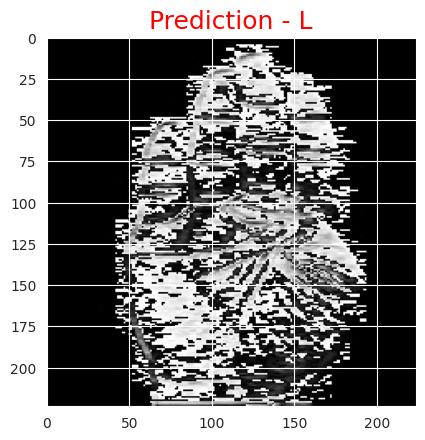

In [216]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


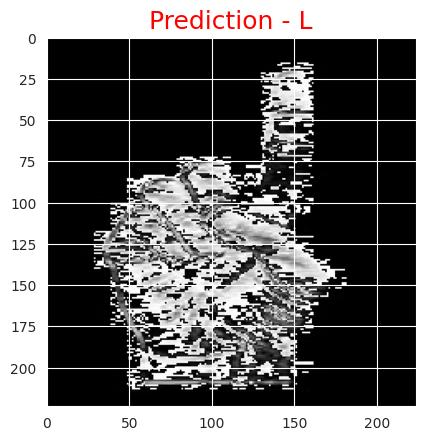

In [217]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


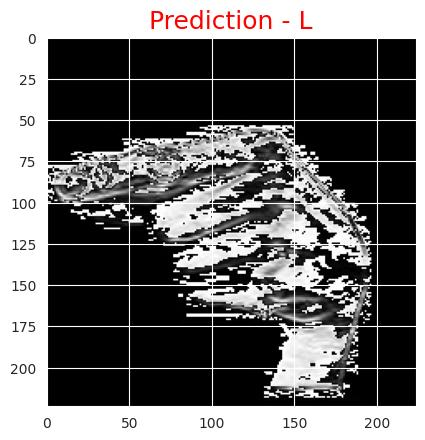

In [218]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


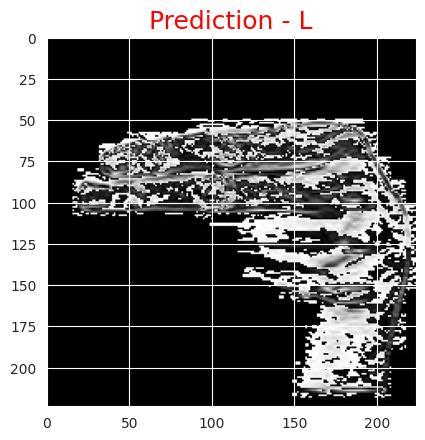

In [219]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


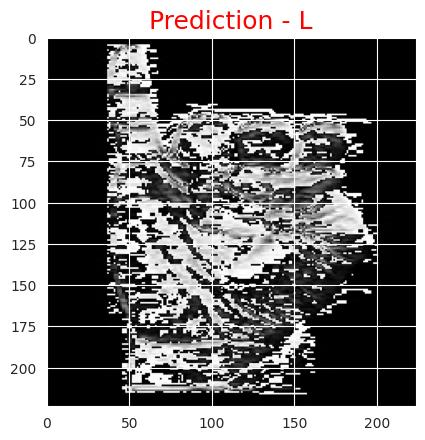

In [220]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


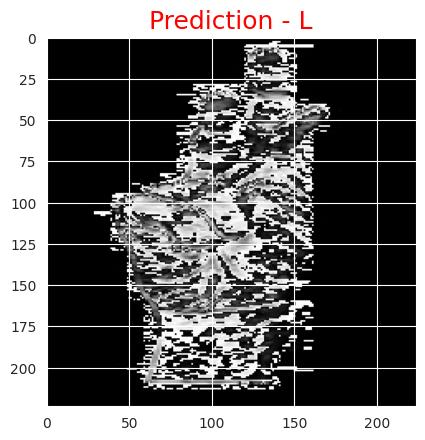

In [221]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


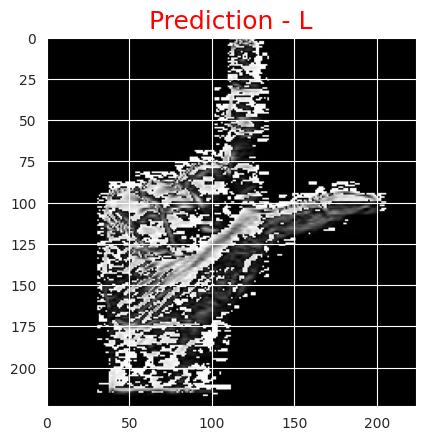

In [222]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


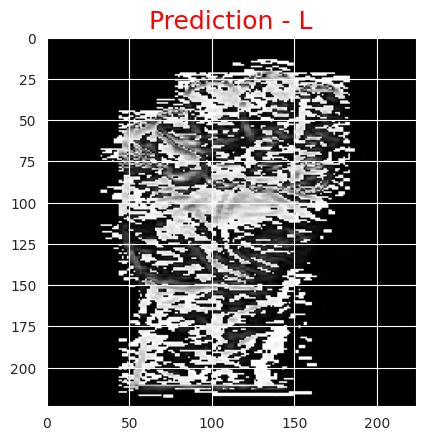

In [223]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


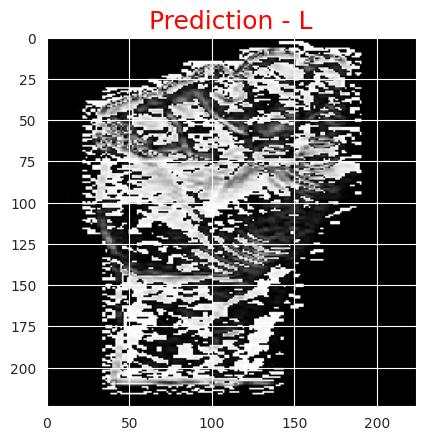

In [224]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


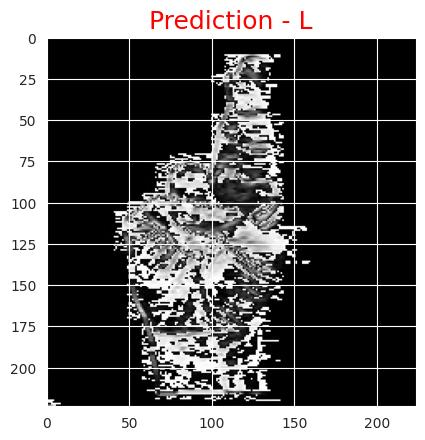

In [225]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


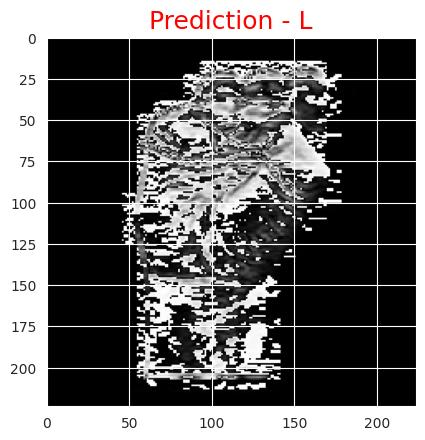

In [226]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


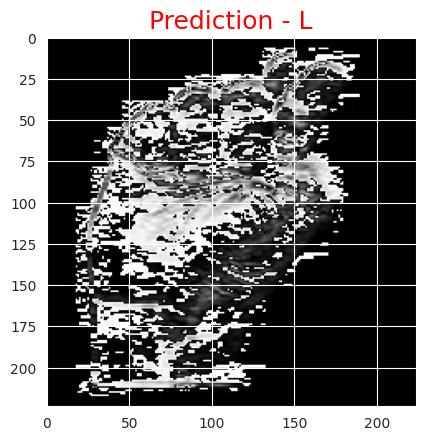

In [227]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


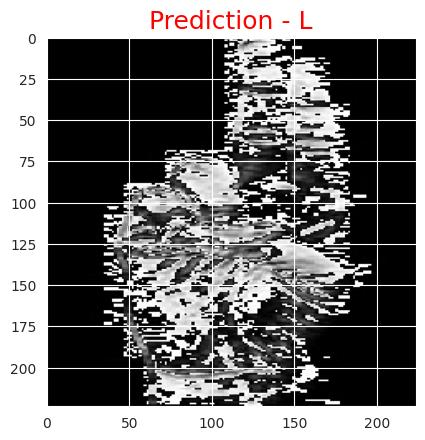

In [228]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


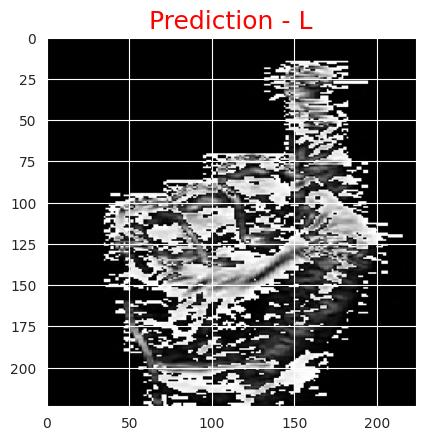

In [229]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


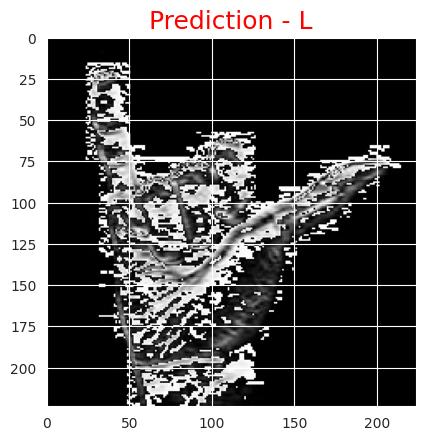

In [230]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **ResNet50v2**

In [231]:
model = model_50v2

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


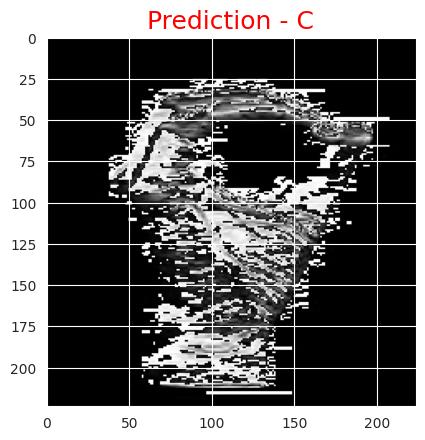

In [232]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


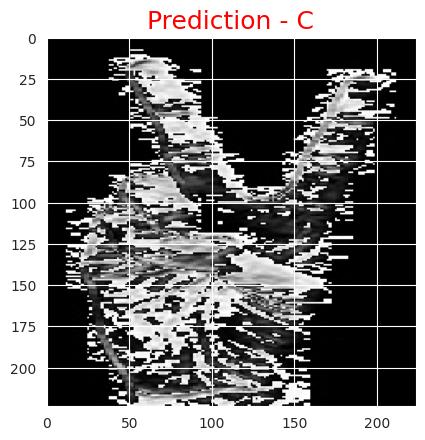

In [233]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


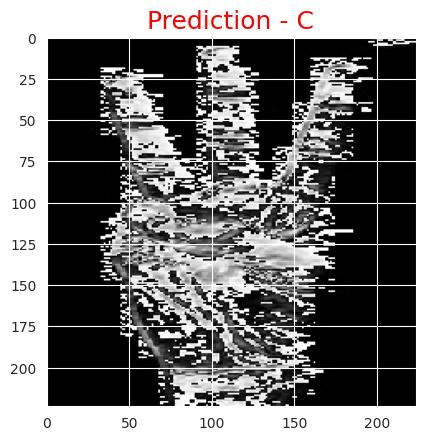

In [234]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


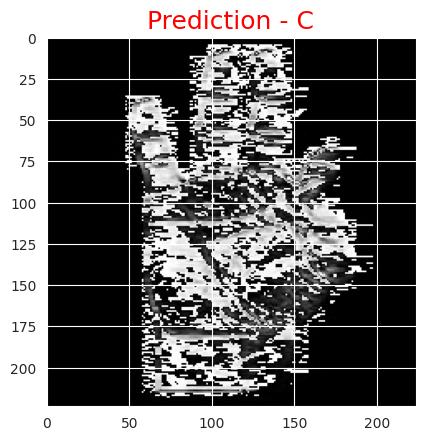

In [235]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


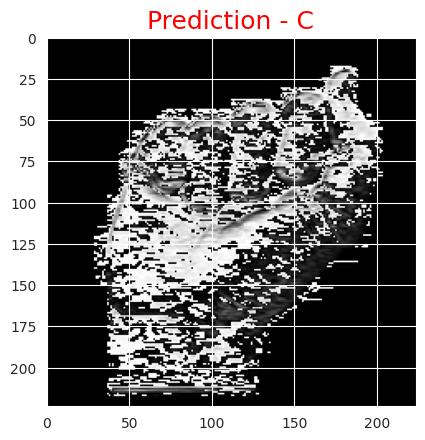

In [236]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


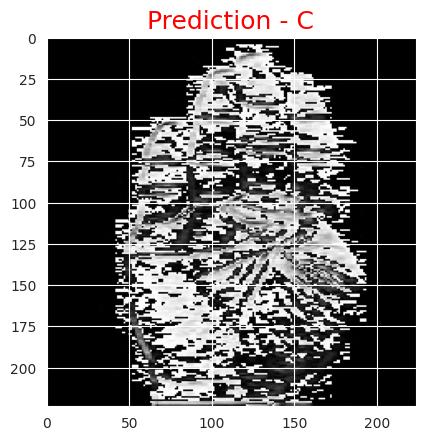

In [237]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


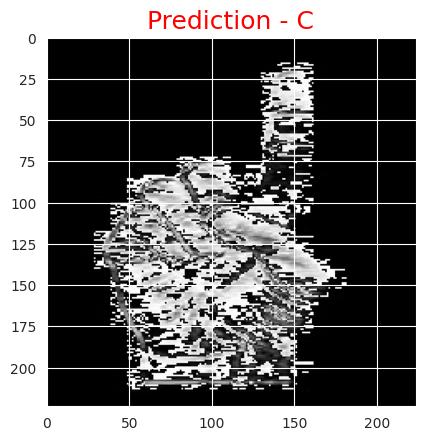

In [238]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


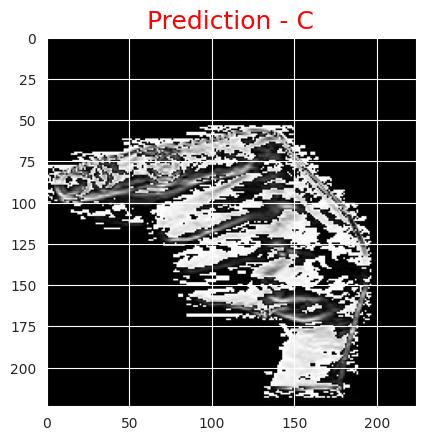

In [239]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


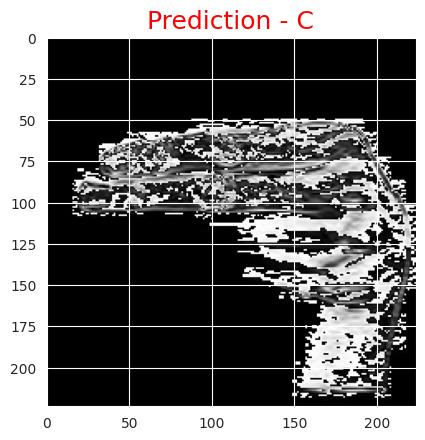

In [240]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


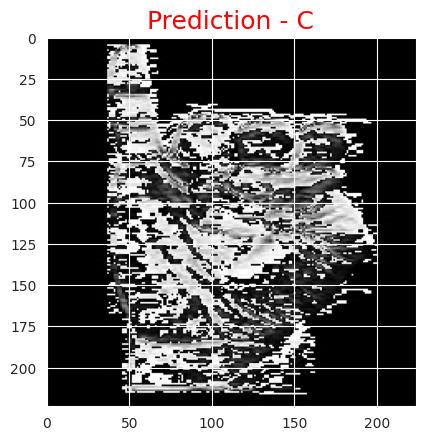

In [241]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


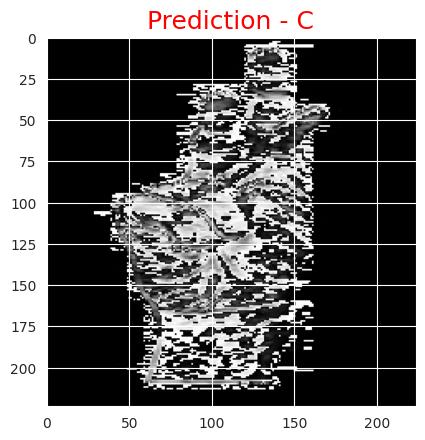

In [242]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


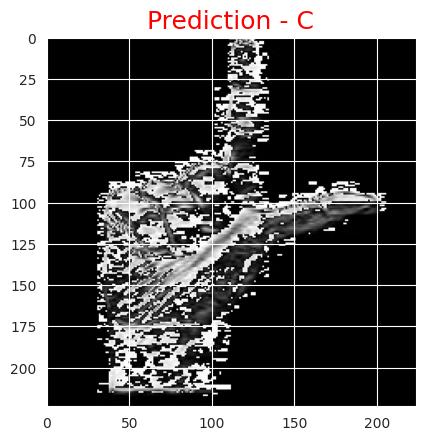

In [243]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


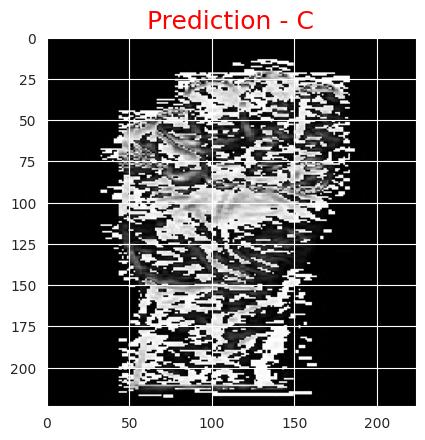

In [244]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


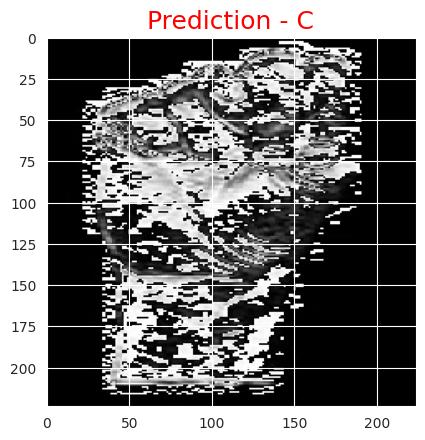

In [245]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


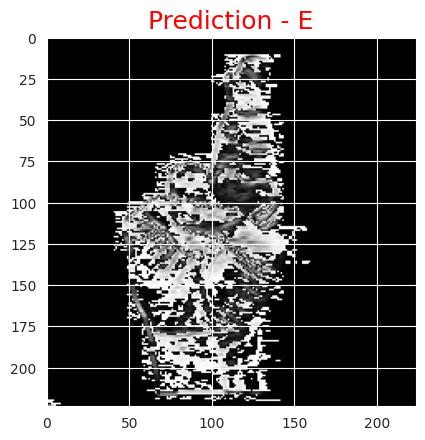

In [246]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


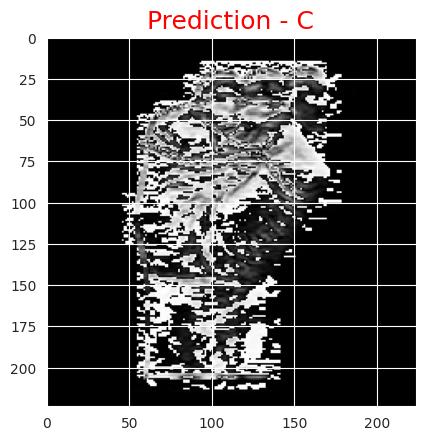

In [247]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


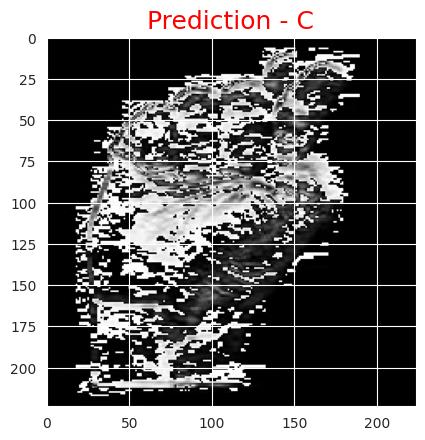

In [248]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


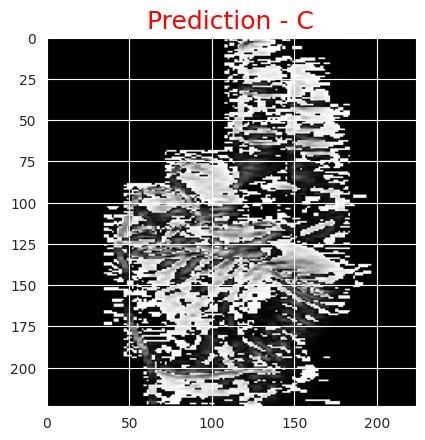

In [249]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


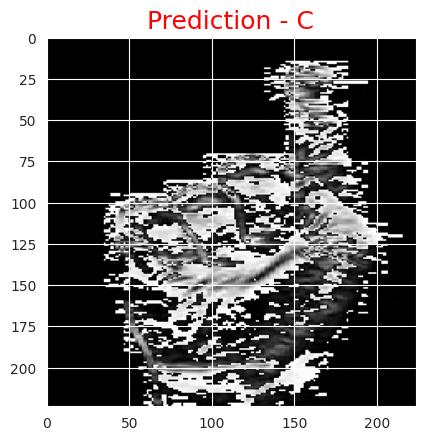

In [250]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


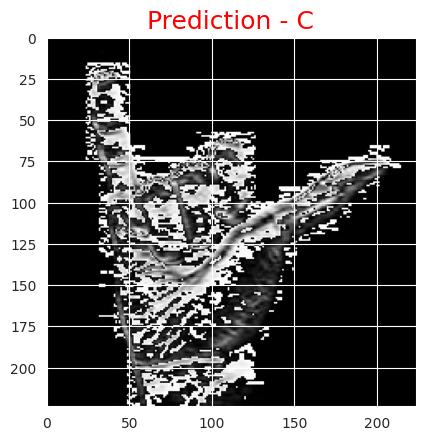

In [251]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **InceptionResNet50v2**

In [252]:
model = model_irv2

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


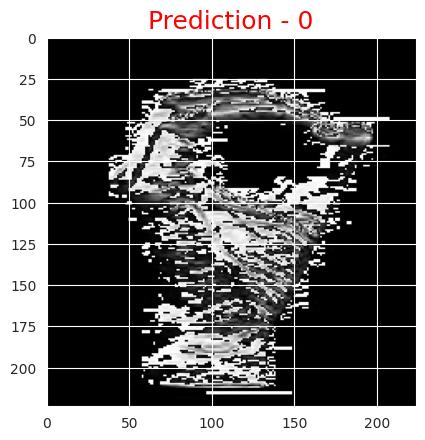

In [253]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


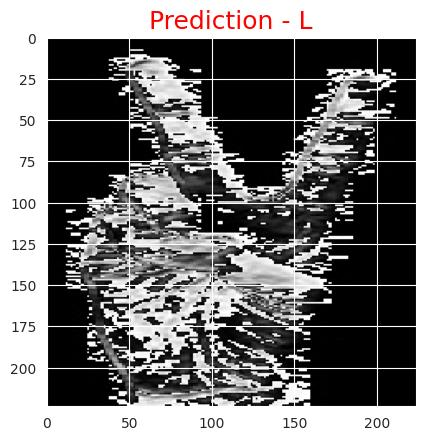

In [254]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


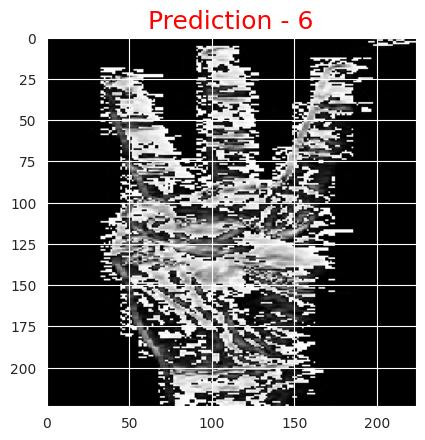

In [255]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


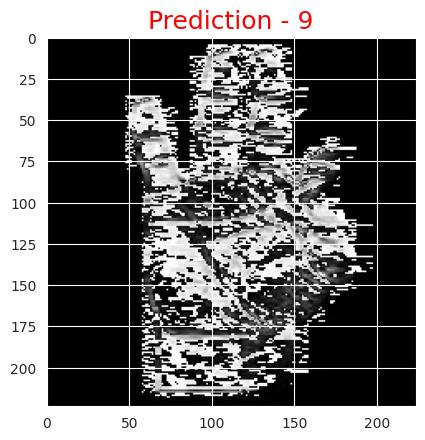

In [256]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


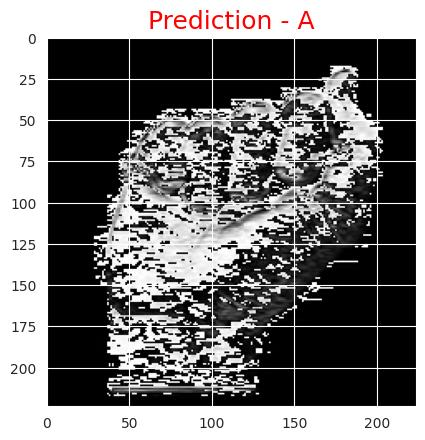

In [257]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


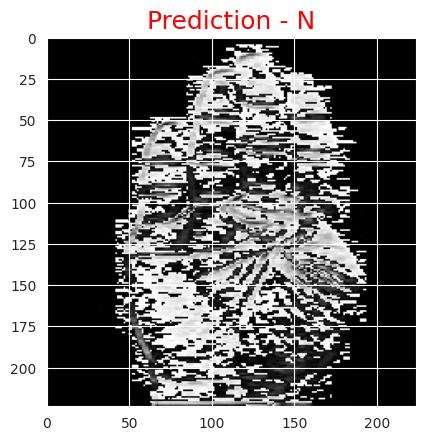

In [258]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


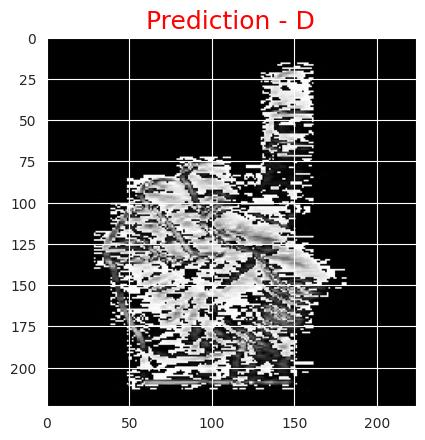

In [259]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


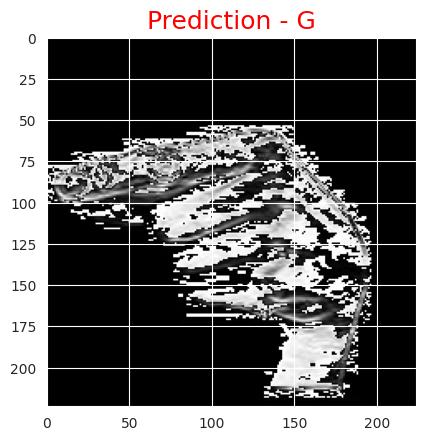

In [260]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


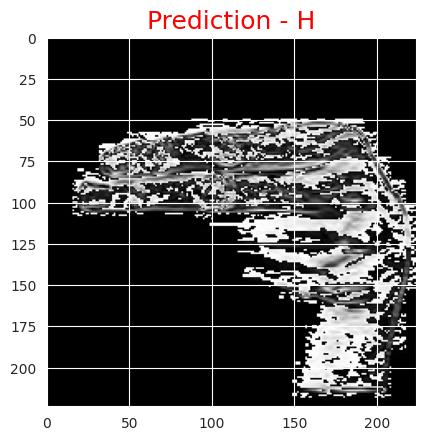

In [261]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


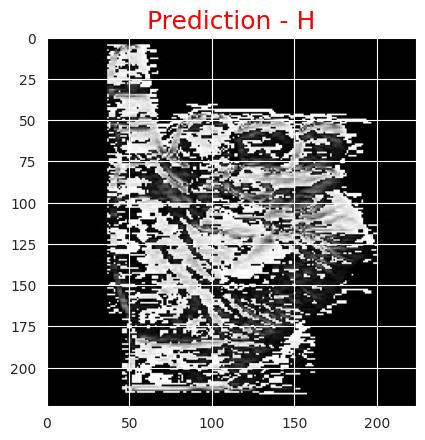

In [262]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


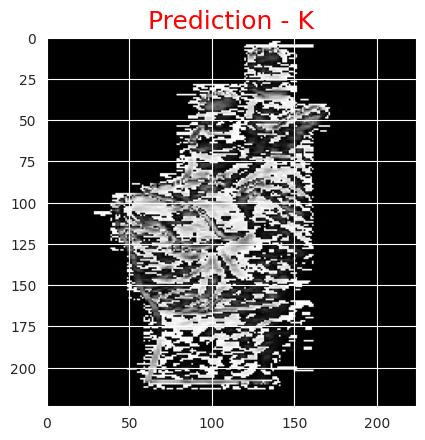

In [263]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


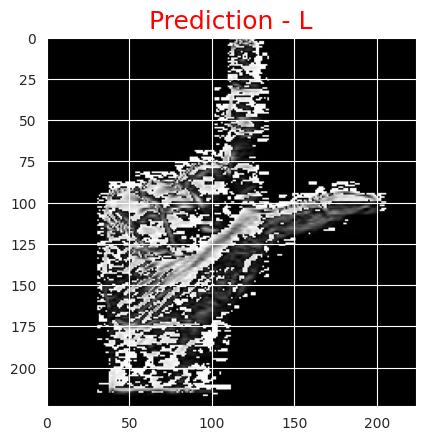

In [264]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


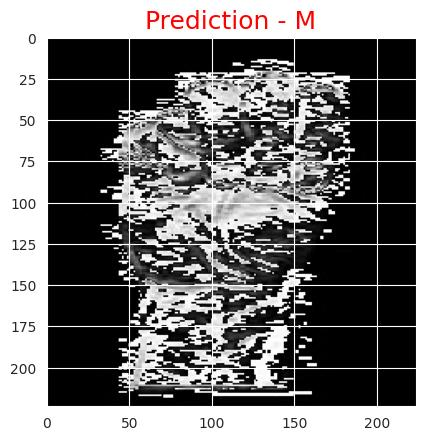

In [265]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


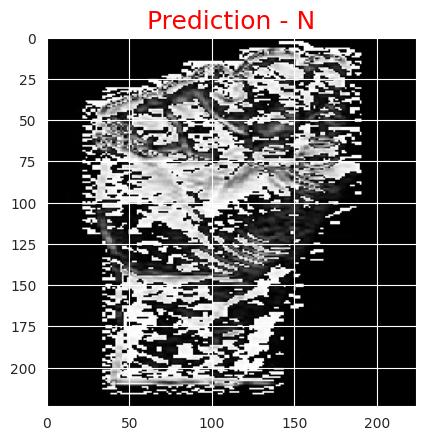

In [266]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


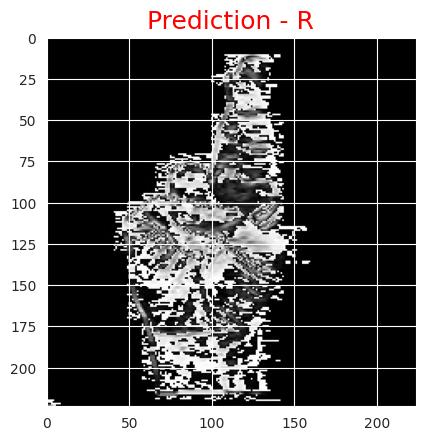

In [267]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


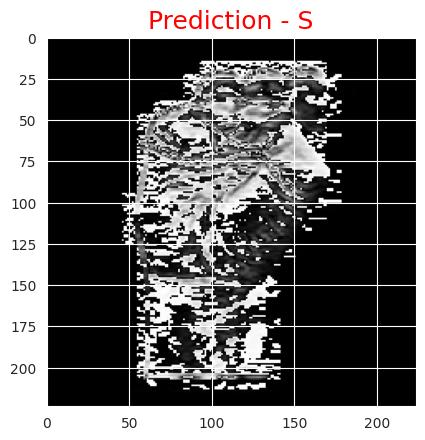

In [268]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


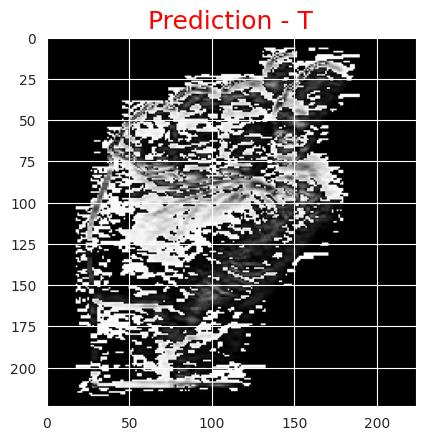

In [269]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


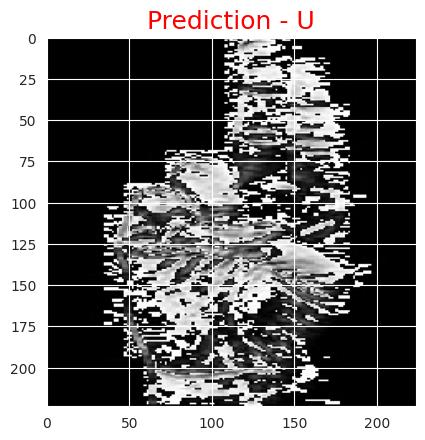

In [270]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


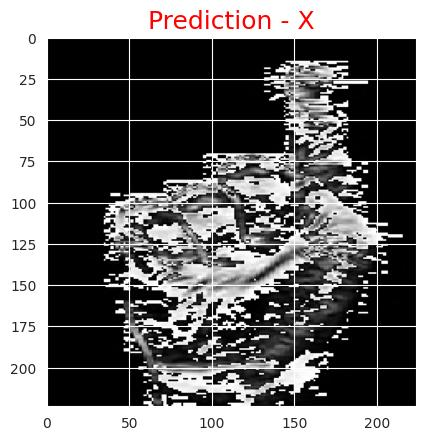

In [271]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


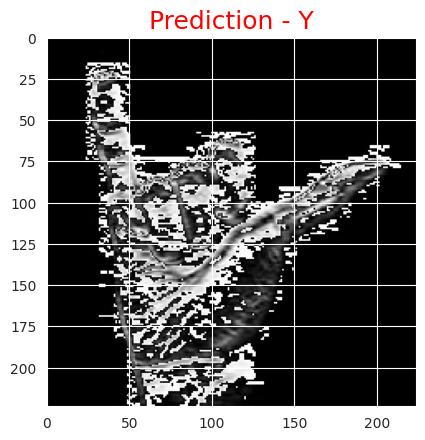

In [272]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **MobileNet**

In [273]:
model = model_mnet

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


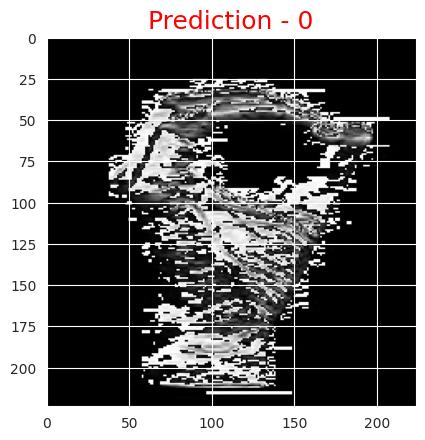

In [274]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


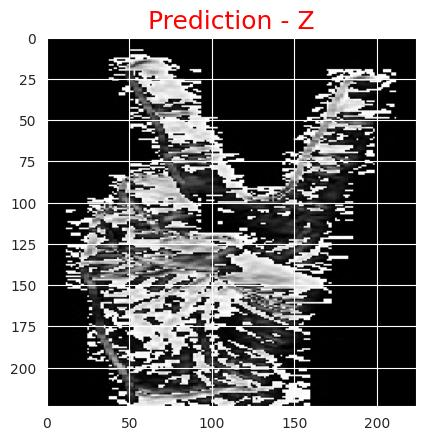

In [275]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


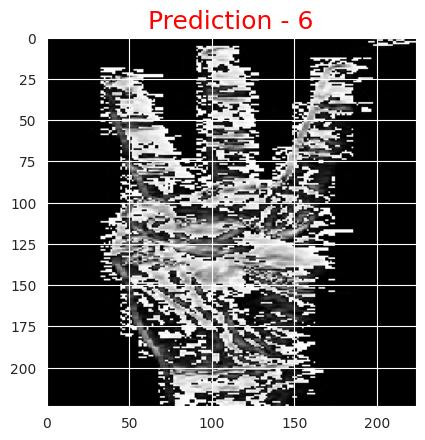

In [276]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


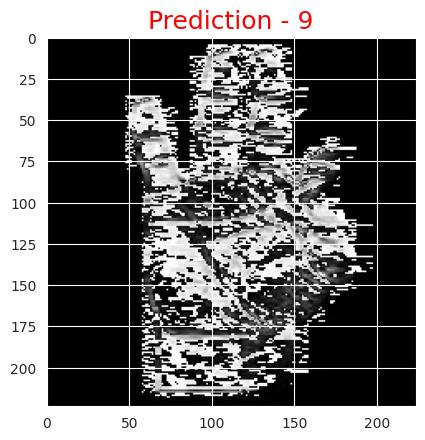

In [277]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


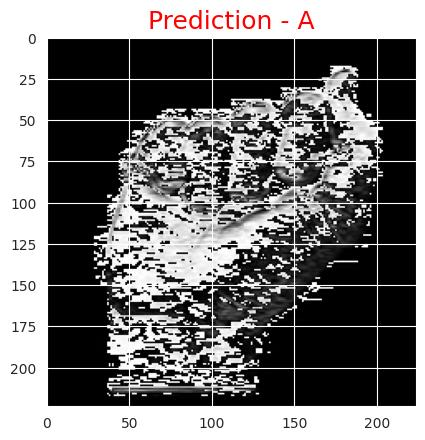

In [278]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


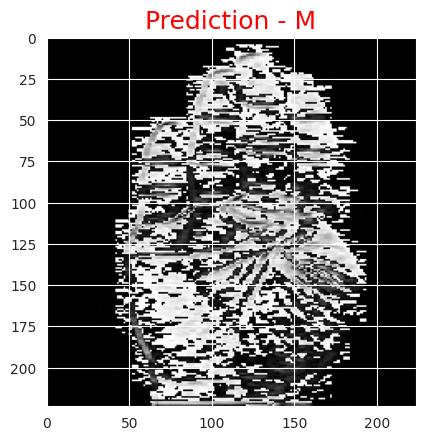

In [279]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


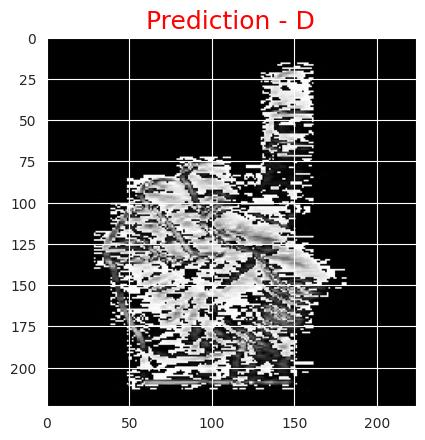

In [280]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


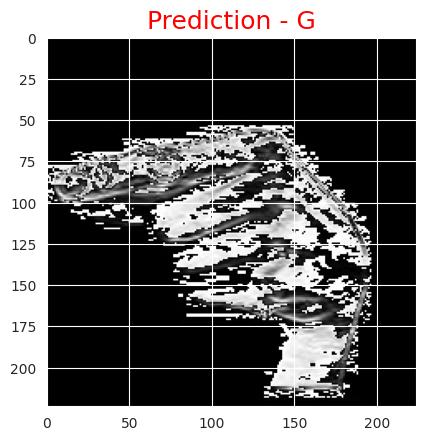

In [281]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


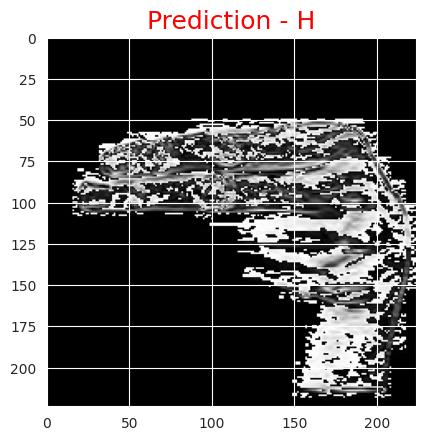

In [282]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


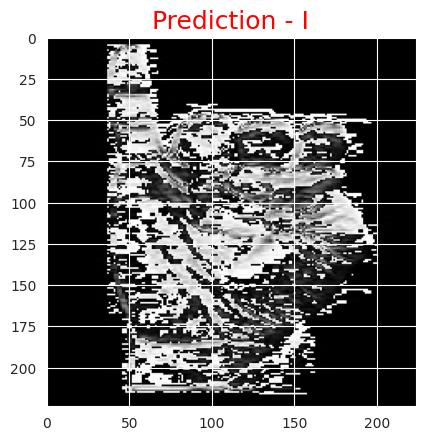

In [283]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


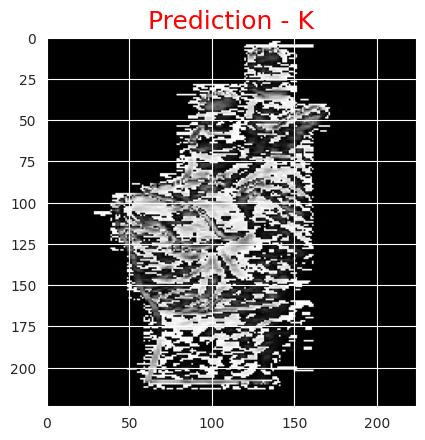

In [284]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


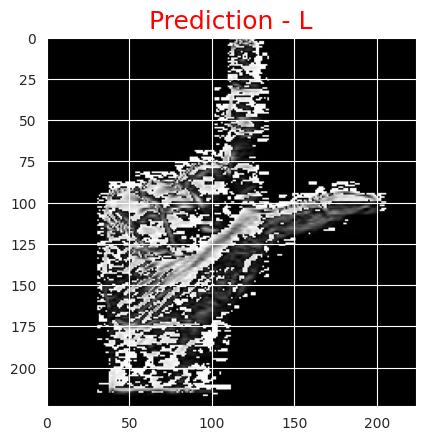

In [285]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


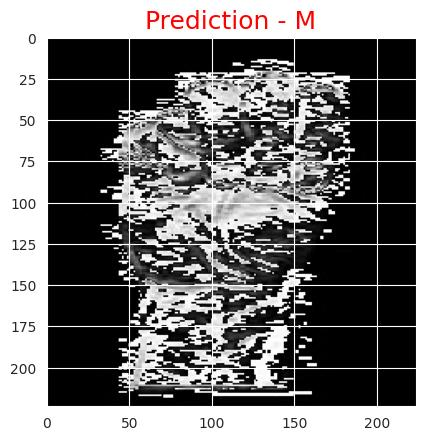

In [286]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


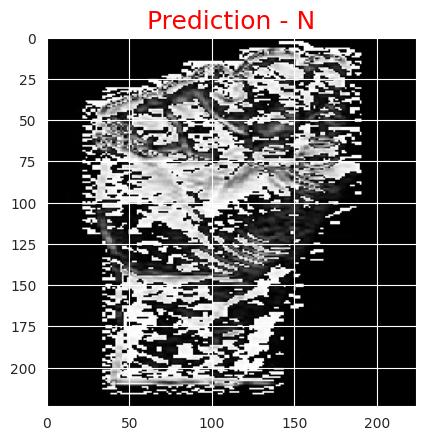

In [287]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


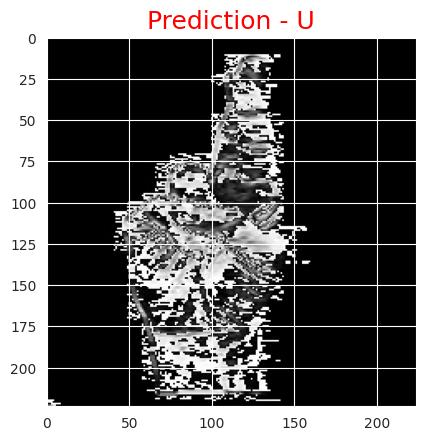

In [288]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


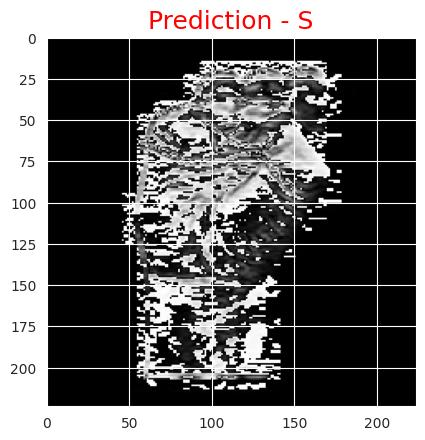

In [289]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


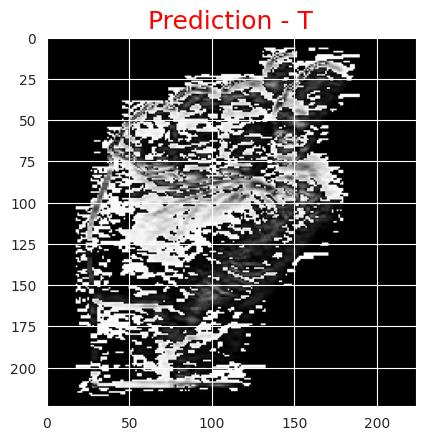

In [290]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


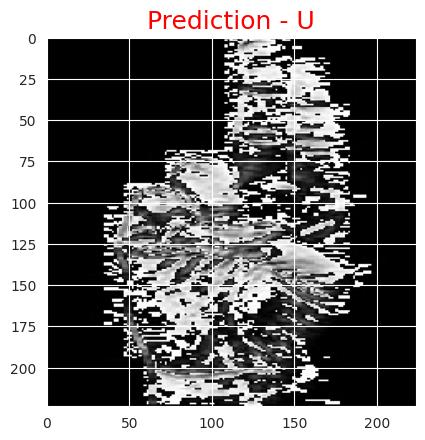

In [291]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


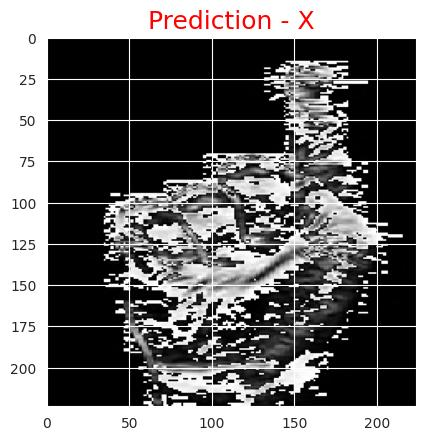

In [292]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


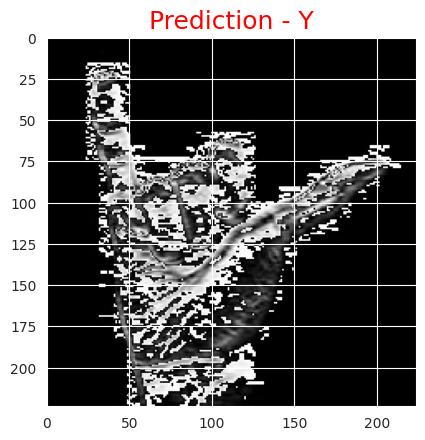

In [293]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)

# **MobileNetV2**

In [294]:
model = model_mnetv2

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


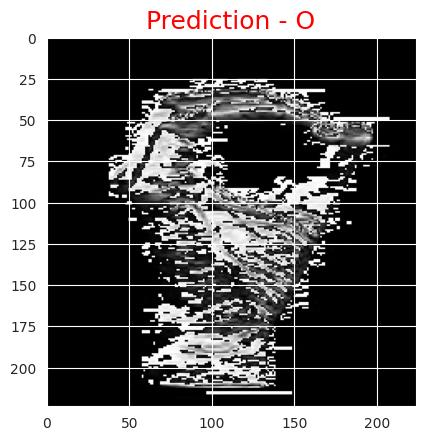

In [295]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_0_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


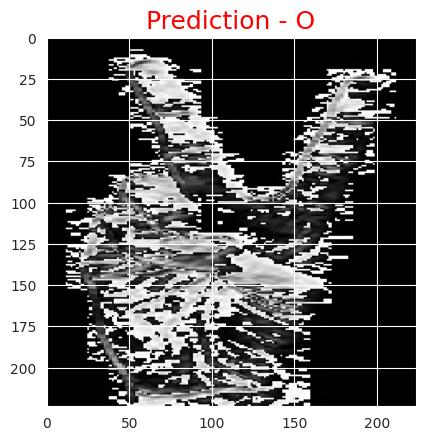

In [296]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_2_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


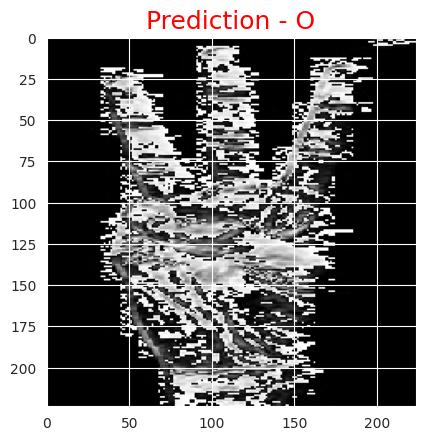

In [297]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_6_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


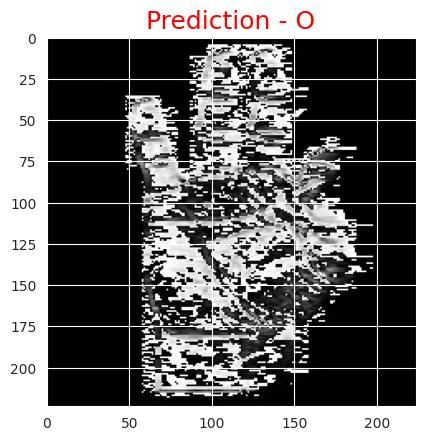

In [298]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_9_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


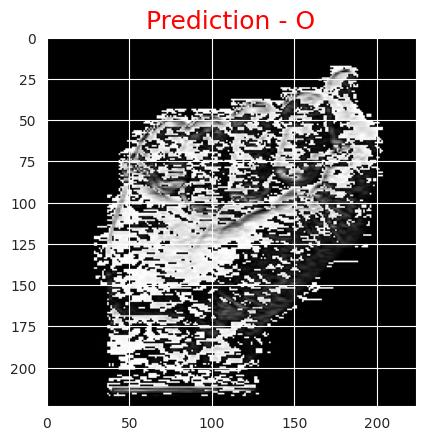

In [299]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_a_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


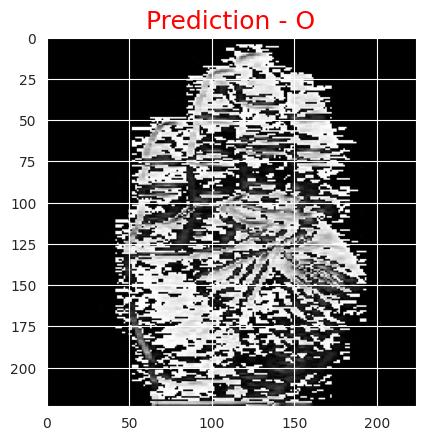

In [300]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_b_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


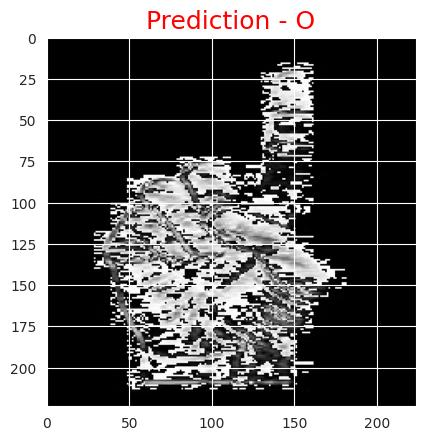

In [301]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_d_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


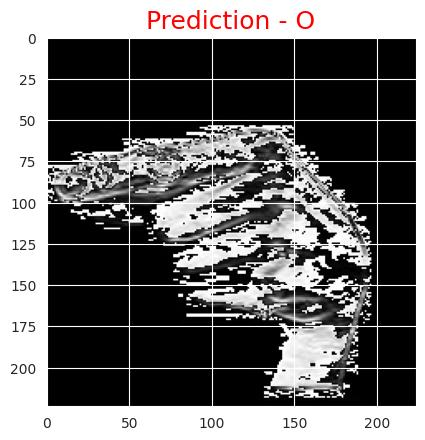

In [302]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_g_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


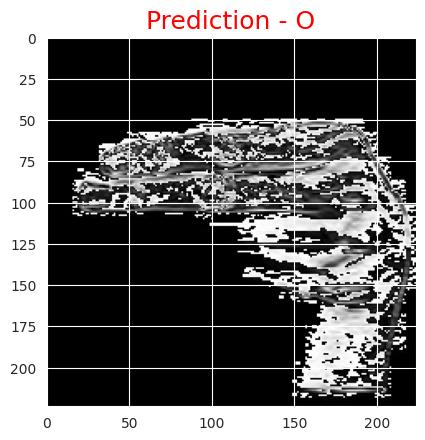

In [303]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_h_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


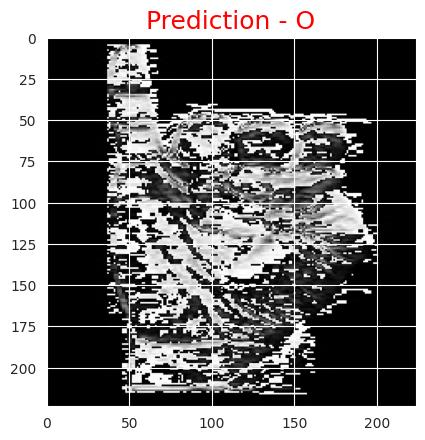

In [304]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_i_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


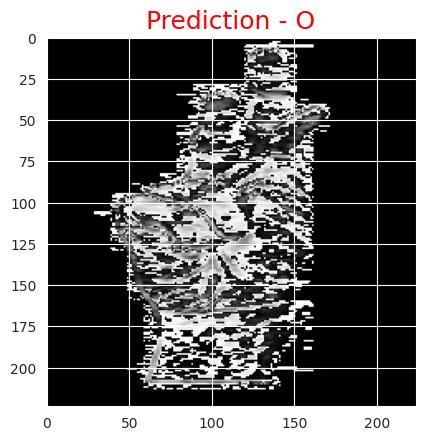

In [305]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_k_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


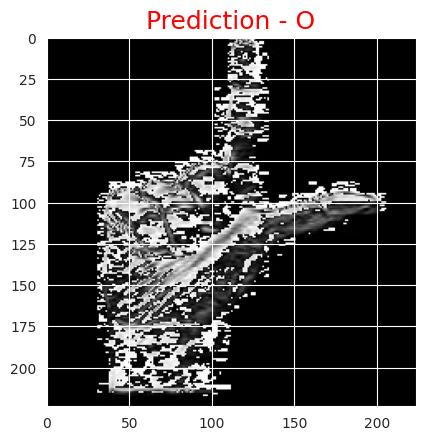

In [306]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_l_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


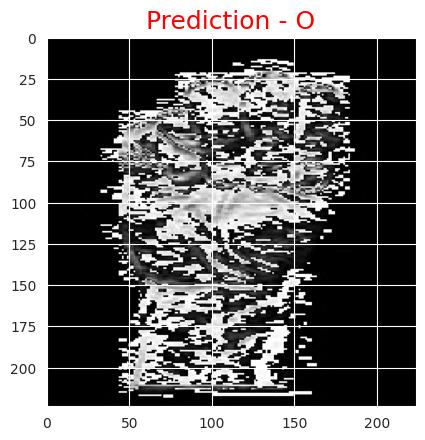

In [307]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_m_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


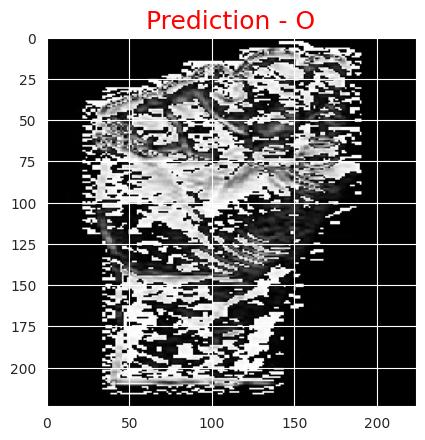

In [308]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_n_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


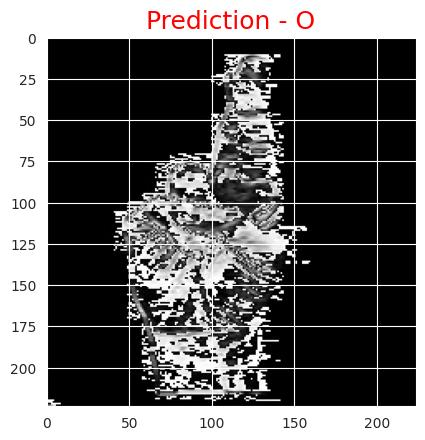

In [309]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_r_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


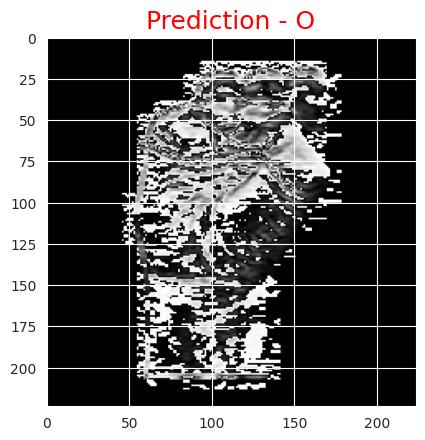

In [310]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_s_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


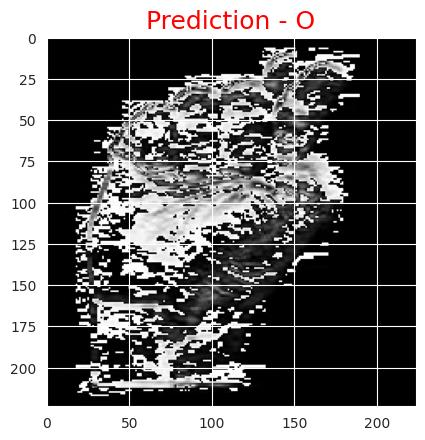

In [311]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_t_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


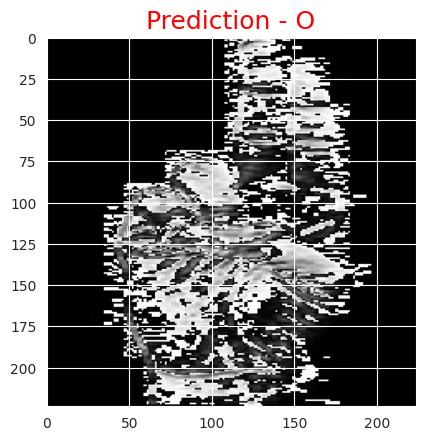

In [312]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_u_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


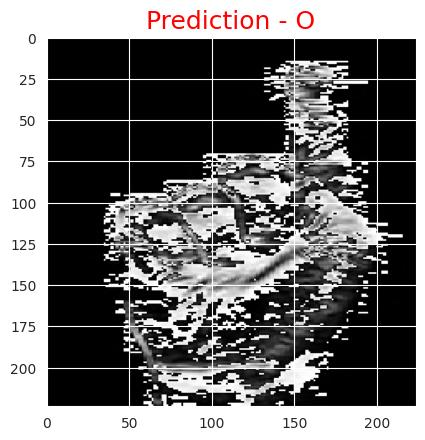

In [313]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_x_seg_1_cropped.jpeg', model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


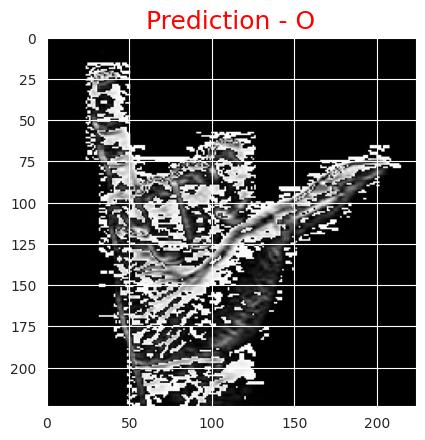

In [314]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/prewitt/hand_y_seg_1_cropped.jpeg', model)